#### Ski Resort Project University of Zürich 2020
## The test notebook for case6_Davos Jakobshorn_2140_ 1540-2590 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [2]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

### *Seting up the display extent*

In [3]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [4]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [5]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


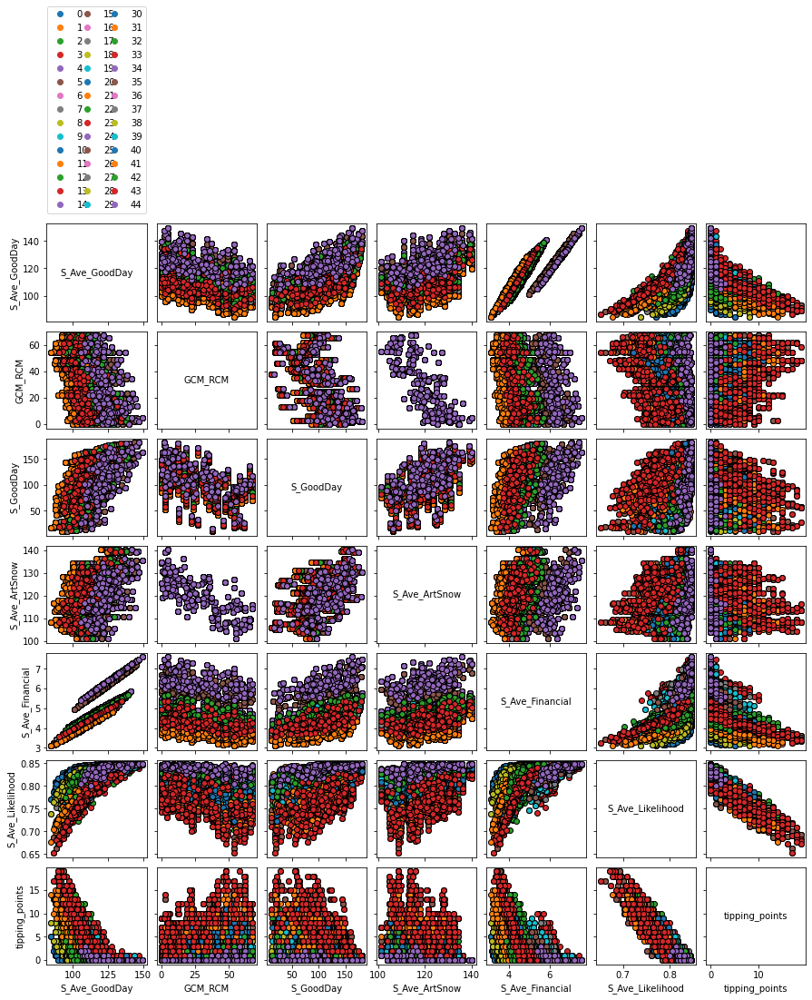

In [6]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [10]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [11]:
print(outcomes2)

{'S_Ave_GoodDay': array([111.96886407, 135.61568814, 112.83087153, ..., 121.57646017,
       121.67876483, 125.08966568]), 'S_GoodDay': array([[171.78916, 168.97544, 105.65656, ...,  91.2998 ,  14.46292,
         22.76032],
       [ 86.23024,  78.72192, 143.64676, ..., 151.99296, 118.44872,
        157.47048],
       [104.13644, 136.6684 , 169.3816 , ...,  99.50848, 102.64136,
        103.84136],
       ...,
       [144.21675, 142.12025, 128.5402 , ...,  83.9969 , 154.5767 ,
        150.44565],
       [166.53535, 122.1893 , 155.04675, ..., 104.2197 ,  61.42365,
         89.5045 ],
       [128.2968 , 180.5609 , 167.8781 , ...,  99.39   , 127.3266 ,
        162.8553 ]]), 'S_Ave_ArtSnow': array([107.69644068, 128.14601695, 124.56686441, ..., 132.91762712,
       103.61855932, 130.49016949]), 'S_Ave_Financial': array([4.58423729, 5.5509322 , 4.64915254, ..., 6.22033898, 6.22364407,
       6.39186441]), 'S_Ave_Likelihood': array([0.81056453, 0.84745763, 0.84582704, ..., 0.84113624, 0.830281

In [12]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [13]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


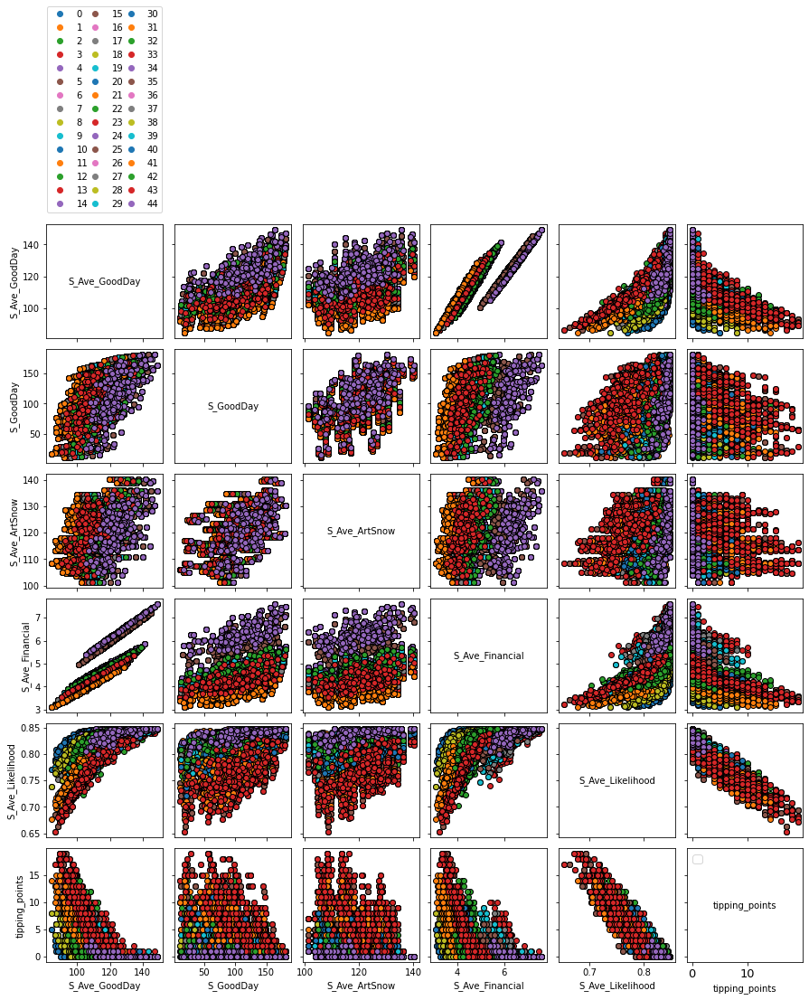

In [14]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [15]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [16]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [17]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.554336,1013.874048,5.300301,-1.528231,1.467991,0.776031,3.0,250.0,60.0,0,0,UZHModel,111.968864,60,171.78916,168.97544,105.65656,125.47276,135.51148,139.84328,125.03968,156.57152,128.36800,149.57856,148.17496,161.04508,134.17200,153.81380,64.54472,181.00000,163.88916,156.77016,124.79748,87.03696,...,127.06780,75.95952,86.26488,101.71012,16.40744,96.00804,112.07980,97.89708,143.11756,103.44484,100.78260,36.11748,90.37032,141.82748,42.42416,80.24180,110.41060,80.81520,105.56120,76.72936,104.93656,42.81304,137.50872,103.06940,96.95224,57.21764,111.57948,91.29980,14.46292,22.76032,107.696441,4.584237,0.810565,0.0
1,1.143825,974.463930,5.723522,-1.477778,0.950589,0.101839,2.0,250.0,60.0,1,0,UZHModel,135.615688,14,86.23024,78.72192,143.64676,126.55400,134.68224,160.58788,173.87928,154.63204,159.91132,163.54732,162.95672,148.27936,171.72452,130.24300,139.30364,155.14040,117.47792,158.82920,173.16500,74.75996,...,144.93856,129.86048,111.43140,120.37348,131.98280,153.86772,143.38044,104.01124,139.64124,149.64040,157.00292,144.37684,106.57780,155.12272,94.25000,160.32884,122.49904,126.74828,77.66052,149.84508,127.85144,163.42040,104.97772,109.14220,124.58616,129.44532,137.45188,151.99296,118.44872,157.47048,128.146017,5.550932,0.847458,0.0
2,1.116114,1014.223506,5.091186,-1.656732,1.802724,0.958387,1.0,250.0,60.0,2,0,UZHModel,112.830872,11,104.13644,136.66840,169.38160,108.98696,167.63900,180.57176,156.72692,114.70528,166.21116,145.88012,117.94768,141.88912,139.11292,122.41432,125.90468,125.84216,126.29484,98.27576,140.91172,92.77404,...,76.07952,132.79688,111.14328,46.37744,99.11328,73.10324,113.36704,122.84776,65.19724,103.06440,110.86940,87.80020,119.90980,108.95292,106.10544,89.10472,121.21660,104.61468,118.23948,131.03372,67.81016,87.39556,89.29876,86.97752,62.69108,75.50704,113.25872,99.50848,102.64136,103.84136,124.566864,4.649153,0.845827,0.0
3,1.228952,906.505599,5.682659,-1.948823,1.601764,0.129099,1.0,250.0,60.0,3,0,UZHModel,117.653076,1,99.51760,148.25780,171.33536,101.75804,127.97192,133.21860,176.36696,110.72004,115.03028,124.39904,118.73700,140.52568,178.80400,156.73592,126.47064,141.06664,109.10648,141.81956,59.82944,136.70440,...,140.56524,80.31076,133.91268,135.28312,107.31528,93.22424,97.34836,125.63292,76.60912,147.81952,103.01248,110.21516,126.08232,126.79672,116.15516,143.49076,112.52480,127.65380,41.07336,88.32116,107.76116,83.88008,120.41212,93.28440,109.06600,82.67860,70.98464,103.88136,134.10352,154.08964,118.993475,4.831102,0.842055,0.0
4,1.414422,949.273974,5.607959,-1.736718,2.978376,0.877783,2.0,250.0,60.0,4,0,UZHModel,113.178169,33,140.46688,141.02612,126.57460,109.56504,149.78616,152.33036,132.60272,130.43188,179.59504,152.39316,149.36200,159.73152,135.37040,66.72552,162.60220,87.48336,102.27064,142.17320,150.93452,74.42652,...,96.73248,118.11596,123.50772,123.90740,94.41796,117.51352,115.07208,56.57888,112.32768,89.04684,122.38556,72.89644,120.22916,87.52980,89.64332,149.59088,70.92760,57.21068,56.65496,94.78068,58.78240,97.94640,64.14220,65.58096,69.82176,87.86504,121.11572,58.13044,81.49116,88.28904,116.747119,4.665932,0.845944,0.0


In [18]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [19]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [20]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [21]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [22]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [23]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [24]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [25]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [26]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp
Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp
ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp
isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp


In [27]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [28]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [29]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [30]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [31]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[86.49892333]
[98.99914182]
[116.84818809]
[140.74074074]
[159.502465]
(118, 1)
[3.269]
[3.95]
[4.99]
[6.01]
[6.97]
(118, 1)
[118.075]
[125.525]
[132.715]
[138.9825]
[147.248]
(118, 1)
[99.08961195]
[100.]
[100.]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [32]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

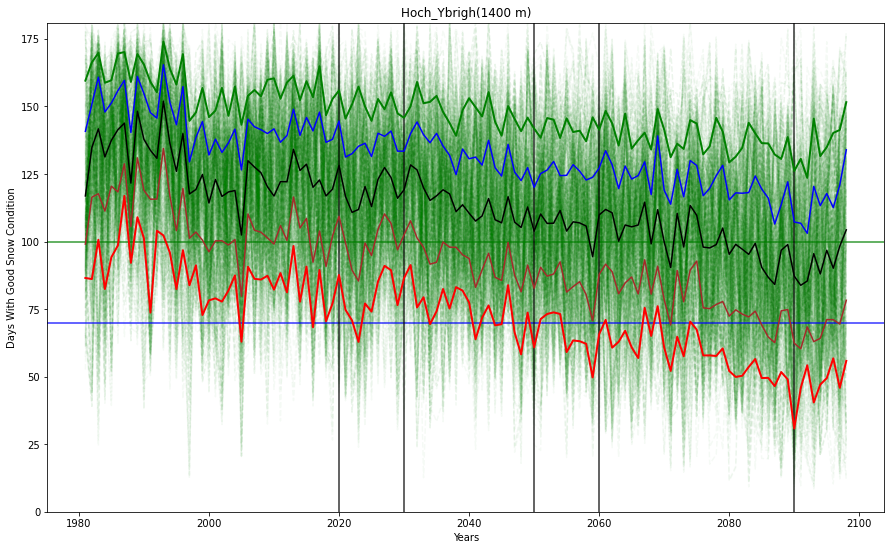

In [33]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

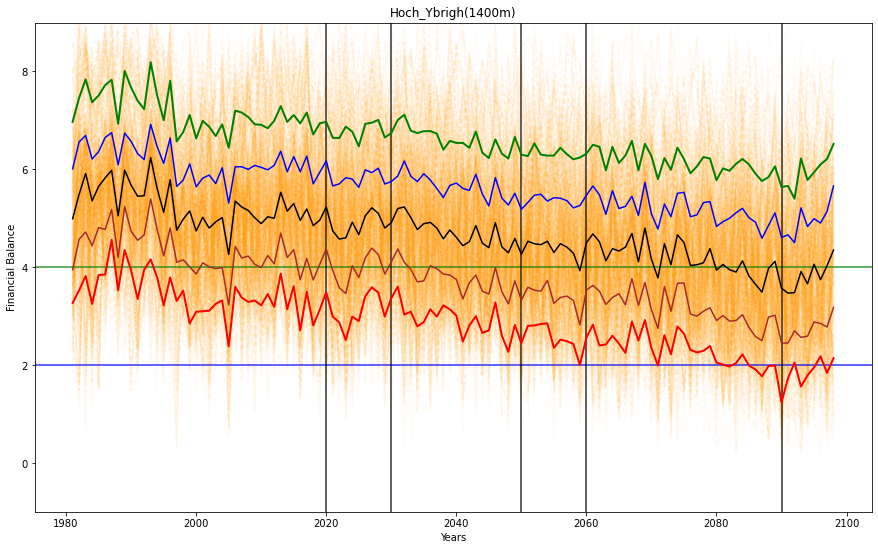

In [34]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

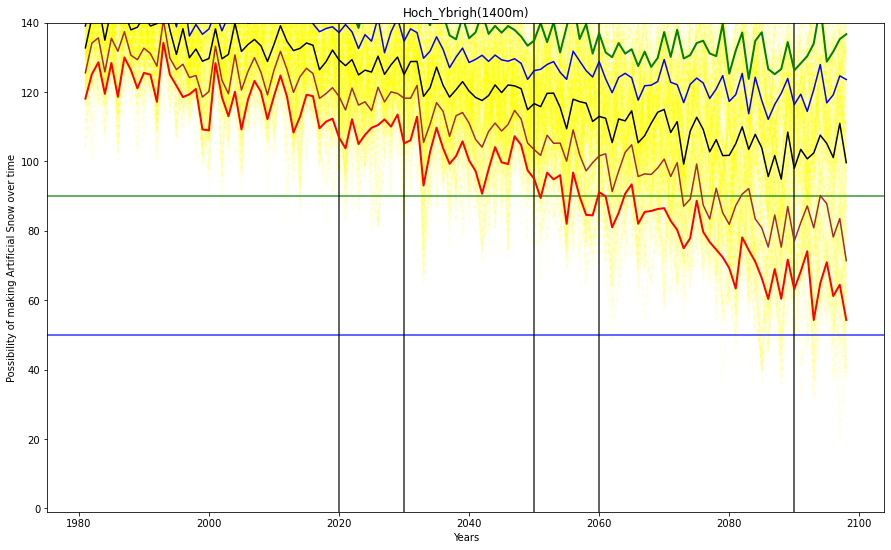

In [35]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

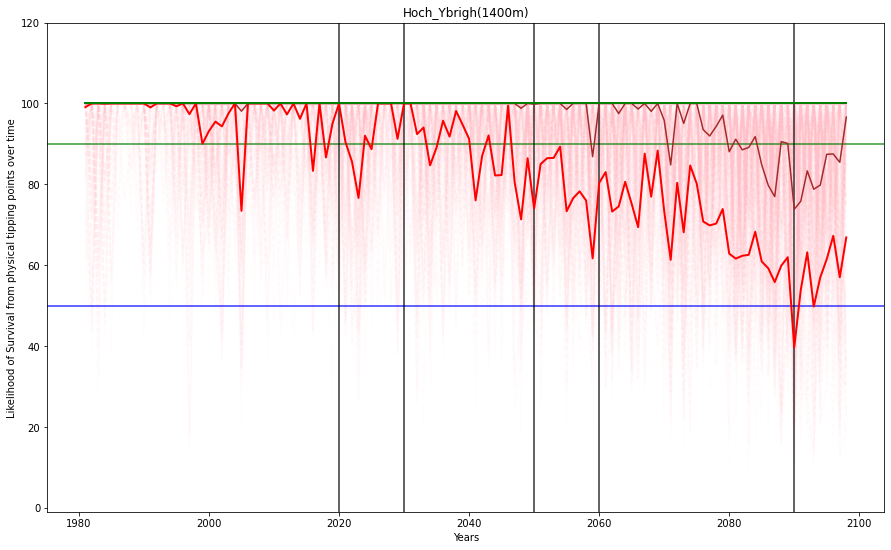

In [36]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [37]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 110
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 4345 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.1511111111111111, coverage: 0.3130034522439586, density: 1.0 restricted_dimensions: 7


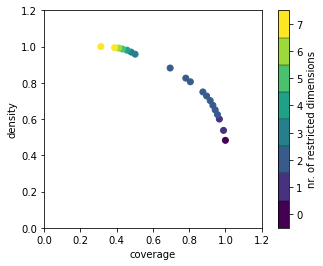

<Figure size 432x288 with 0 Axes>

In [38]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage    0.781358
density     0.826034
id                10
mass        0.456667
mean        0.826034
res_dim            2
Name: 10, dtype: object

                                                     box 10  \
                                                        min   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                                            1.44483   

                                                             \
                                                        max   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                                            3.48121   

                                                 
                                      qp values  
x1SnowThershold  [4.532467067060568e-182, -1.0]  
Xfactor1         [9.677039571411883e-140, -1.0]  



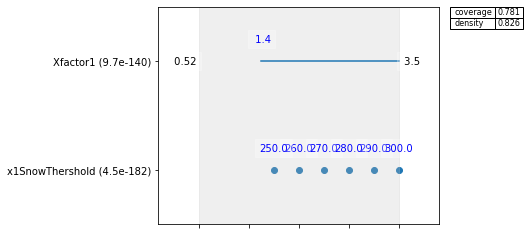

In [39]:
# Saeed : explore the inspect effect
box1.inspect(10)
box1.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 280.0, 250.0, 200.0, 240.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


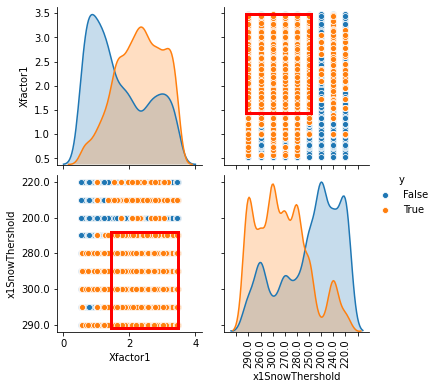

In [40]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(10)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [41]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 7640 points remaining, containing 2985 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowTh

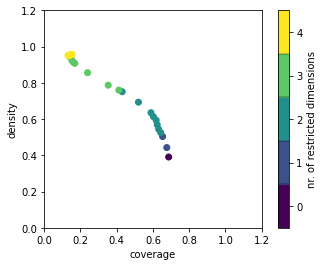

In [42]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

coverage     0.43038
density     0.751004
id                10
mass        0.276667
mean        0.751004
res_dim            2
Name: 10, dtype: object

                                              box 10  \
                                                 min   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0}   
Xfactor1                                     1.19493   

                                                      \
                                                 max   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0}   
Xfactor1                                     3.48121   

                                                 
                                      qp values  
x1SnowThershold  [4.968114676450769e-162, -1.0]  
Xfactor1         [2.2690331404865967e-66, -1.0]  



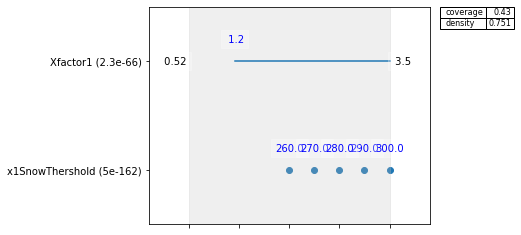

In [43]:
# Saeed : explore the inspect effect
box2.inspect(10)
box2.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 280.0, 200.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


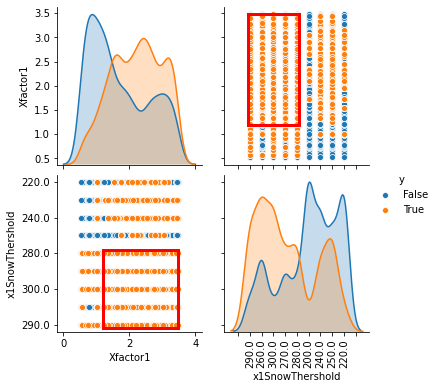

In [44]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(10)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [45]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 120
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 4185 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9838709677419355, mass: 0.31, coverage: 0.6559139784946236, density: 0.9838709677419355 restric

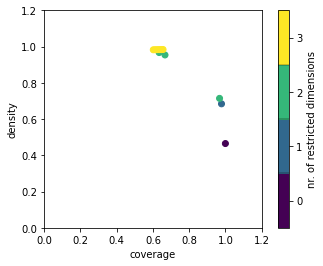

In [46]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.655914
density     0.983871
id                10
mass            0.31
mean        0.983871
res_dim            3
Name: 10, dtype: object

             box 10                                         
                min       max                      qp values
X6tempArt -1.996297 -1.075626  [-1.0, 3.580400241140419e-18]
xRCP       2.500000  3.000000                    [0.0, -1.0]
Xfactor1   0.684557  3.481206  [3.446666018404856e-07, -1.0]



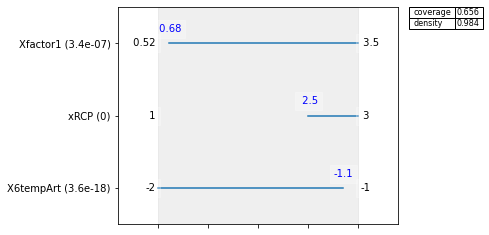

In [47]:
# Saeed : explore the inspect effect
box3.inspect(10)
box3.inspect(10, style='graph')
plt.show()

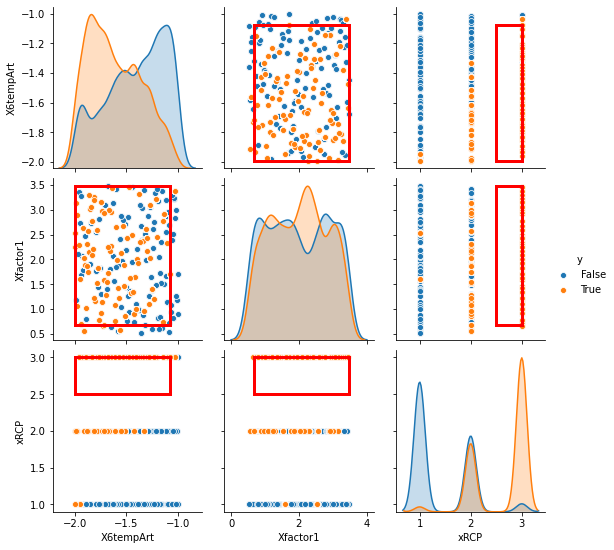

In [48]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(10)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [ ]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 1.2
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

In [ ]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

In [ ]:
# Saeed : explore the inspect effect
box4.inspect(20)
box4.inspect(20, style='graph')
plt.show()

In [ ]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(15)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [49]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 8889 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.7811111111111111, coverage: 0.7908651141860726, density: 1.0 restricted_dimensions: 2


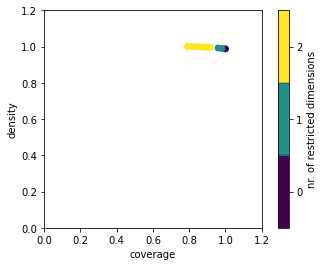

In [50]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.874227
density     0.997561
id                 5
mass        0.865556
mean        0.997561
res_dim            2
Name: 5, dtype: object

                                                    box 5  \
                                                      min   
policy  {0, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...   
X5temp                                             4.5739   

                                                           \
                                                      max   
policy  {0, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, ...   
X5temp                                            5.99394   

                                       
                            qp values  
policy  [9.764411469923175e-10, -1.0]  
X5temp   [0.002123010213033365, -1.0]  



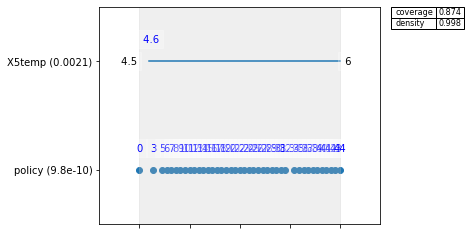

In [51]:
# Saeed : explore the inspect effect
box5.inspect(5)
box5.inspect(5, style='graph')
plt.show()

policy [0, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 1, 2, 4, 33]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


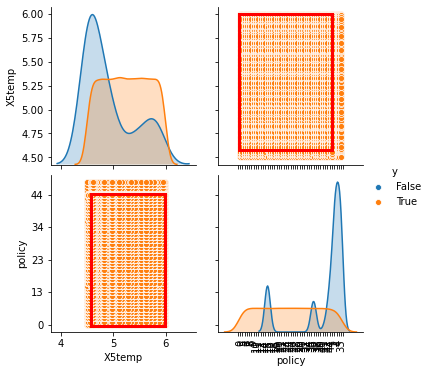

In [52]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(5)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [53]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [54]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [55]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


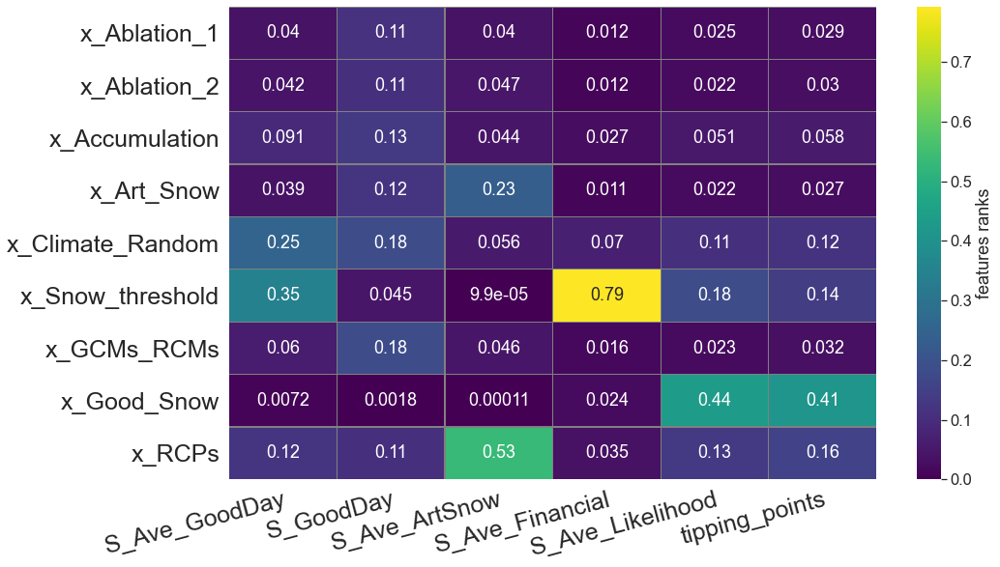

In [56]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


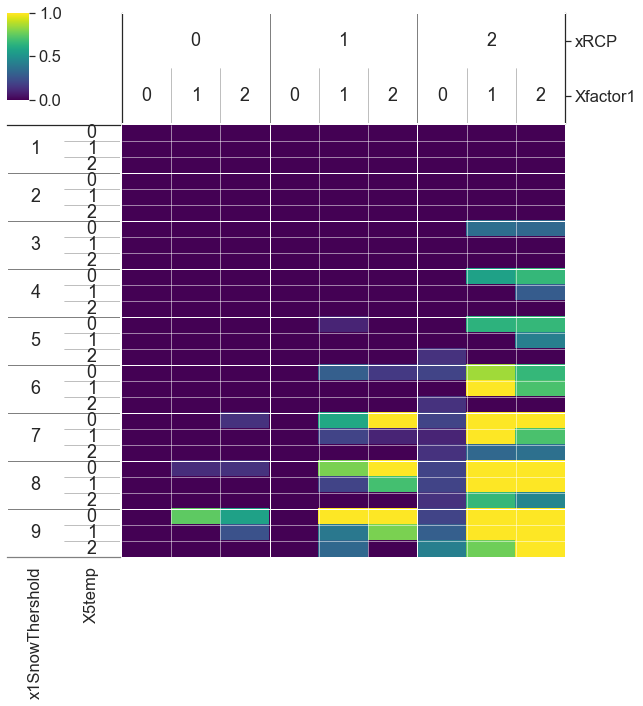

In [57]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 100
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


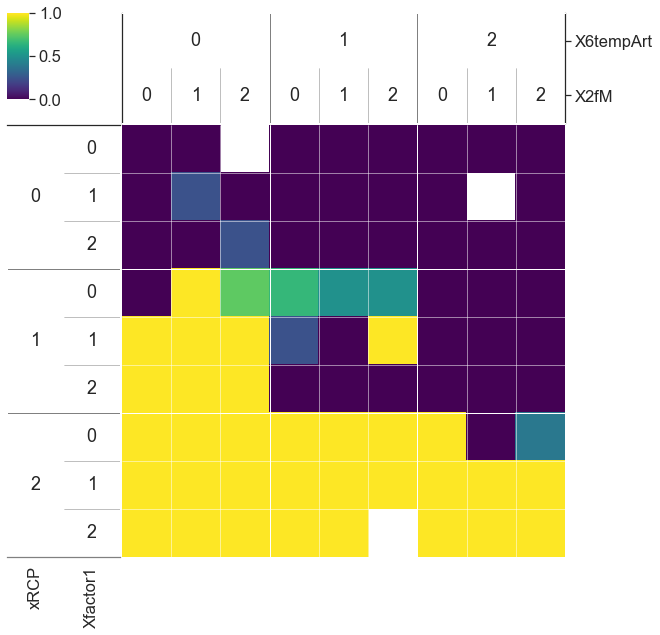

In [58]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 120
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\matplotlib\colors.py:587: RuntimeWarning: invalid value encountered in greater
  xa[xa > self.N - 1] = self._i_over
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\matplotlib\colors.py:588: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = self._i_under


IndexError: arrays used as indices must be of integer (or boolean) type

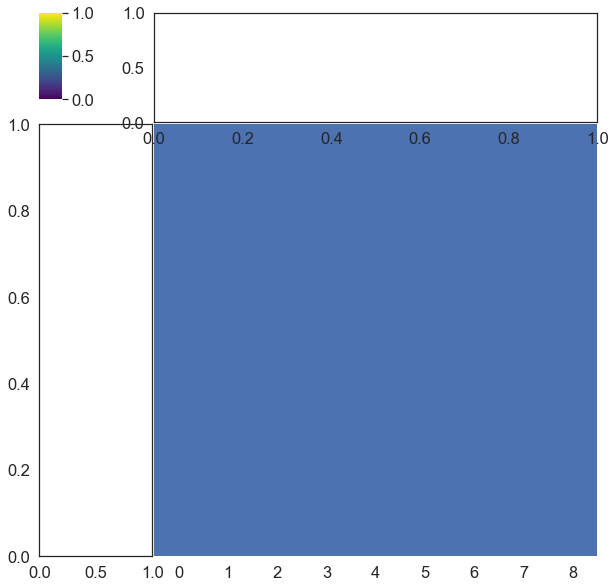

In [59]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 2
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

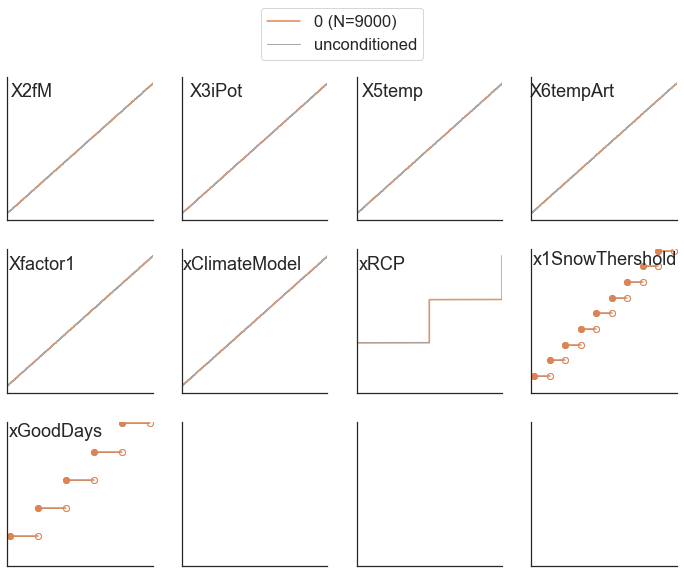

In [60]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

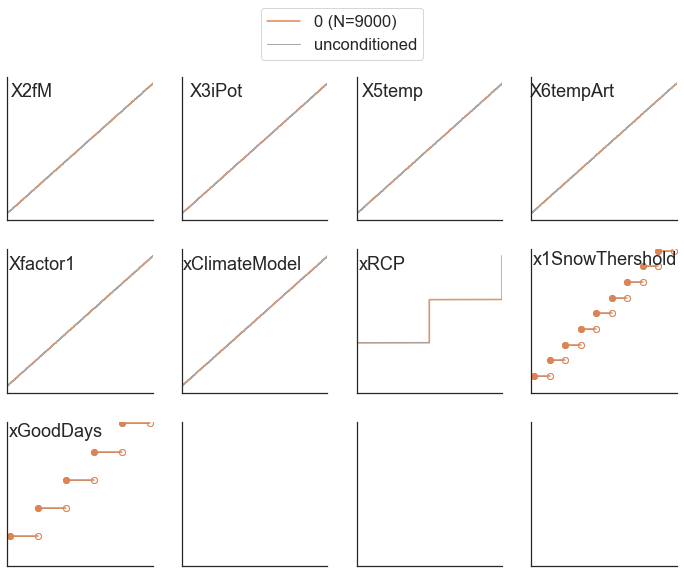

In [61]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

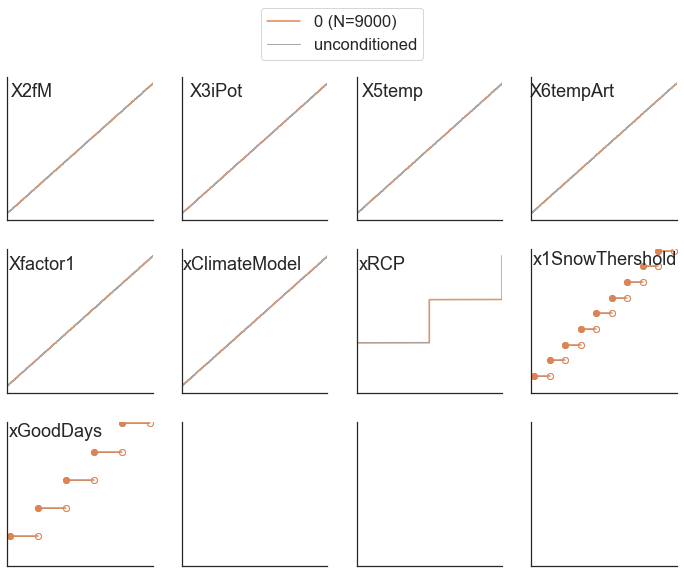

In [62]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

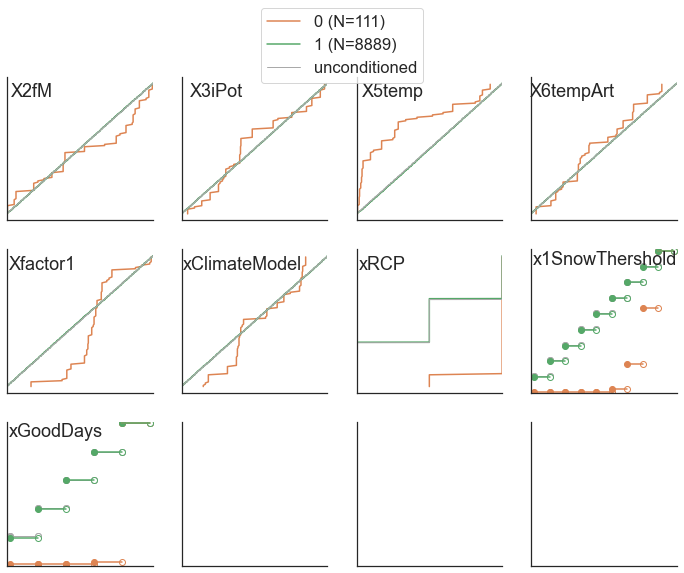

In [63]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

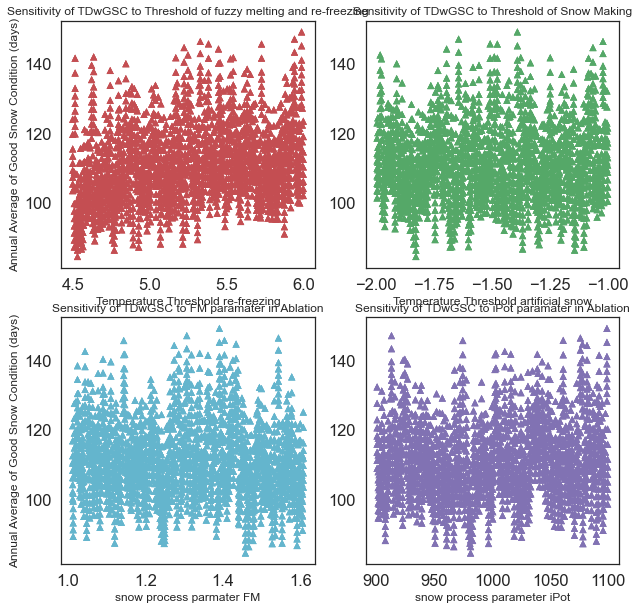

In [64]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

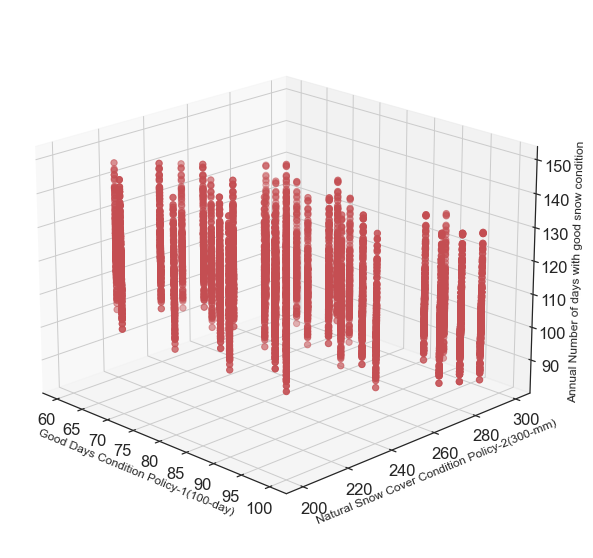

In [65]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [66]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.554336,1013.874048,5.300301,-1.528231,1.467991,0.776031,3.0,250.0,60.0,0,0,UZHModel,111.968864,60,171.78916,168.97544,105.65656,125.47276,135.51148,139.84328,125.03968,156.57152,128.36800,149.57856,148.17496,161.04508,134.17200,153.81380,64.54472,181.00000,163.88916,156.77016,124.79748,87.03696,...,127.06780,75.95952,86.26488,101.71012,16.40744,96.00804,112.07980,97.89708,143.11756,103.44484,100.78260,36.11748,90.37032,141.82748,42.42416,80.24180,110.41060,80.81520,105.56120,76.72936,104.93656,42.81304,137.50872,103.06940,96.95224,57.21764,111.57948,91.29980,14.46292,22.76032,107.696441,4.584237,0.810565,0.0
1,1.143825,974.463930,5.723522,-1.477778,0.950589,0.101839,2.0,250.0,60.0,1,0,UZHModel,135.615688,14,86.23024,78.72192,143.64676,126.55400,134.68224,160.58788,173.87928,154.63204,159.91132,163.54732,162.95672,148.27936,171.72452,130.24300,139.30364,155.14040,117.47792,158.82920,173.16500,74.75996,...,144.93856,129.86048,111.43140,120.37348,131.98280,153.86772,143.38044,104.01124,139.64124,149.64040,157.00292,144.37684,106.57780,155.12272,94.25000,160.32884,122.49904,126.74828,77.66052,149.84508,127.85144,163.42040,104.97772,109.14220,124.58616,129.44532,137.45188,151.99296,118.44872,157.47048,128.146017,5.550932,0.847458,0.0
2,1.116114,1014.223506,5.091186,-1.656732,1.802724,0.958387,1.0,250.0,60.0,2,0,UZHModel,112.830872,11,104.13644,136.66840,169.38160,108.98696,167.63900,180.57176,156.72692,114.70528,166.21116,145.88012,117.94768,141.88912,139.11292,122.41432,125.90468,125.84216,126.29484,98.27576,140.91172,92.77404,...,76.07952,132.79688,111.14328,46.37744,99.11328,73.10324,113.36704,122.84776,65.19724,103.06440,110.86940,87.80020,119.90980,108.95292,106.10544,89.10472,121.21660,104.61468,118.23948,131.03372,67.81016,87.39556,89.29876,86.97752,62.69108,75.50704,113.25872,99.50848,102.64136,103.84136,124.566864,4.649153,0.845827,0.0
3,1.228952,906.505599,5.682659,-1.948823,1.601764,0.129099,1.0,250.0,60.0,3,0,UZHModel,117.653076,1,99.51760,148.25780,171.33536,101.75804,127.97192,133.21860,176.36696,110.72004,115.03028,124.39904,118.73700,140.52568,178.80400,156.73592,126.47064,141.06664,109.10648,141.81956,59.82944,136.70440,...,140.56524,80.31076,133.91268,135.28312,107.31528,93.22424,97.34836,125.63292,76.60912,147.81952,103.01248,110.21516,126.08232,126.79672,116.15516,143.49076,112.52480,127.65380,41.07336,88.32116,107.76116,83.88008,120.41212,93.28440,109.06600,82.67860,70.98464,103.88136,134.10352,154.08964,118.993475,4.831102,0.842055,0.0
4,1.414422,949.273974,5.607959,-1.736718,2.978376,0.877783,2.0,250.0,60.0,4,0,UZHModel,113.178169,33,140.46688,141.02612,126.57460,109.56504,149.78616,152.33036,132.60272,130.43188,179.59504,152.39316,149.36200,159.73152,135.37040,66.72552,162.60220,87.48336,102.27064,142.17320,150.93452,74.42652,...,96.73248,118.11596,123.50772,123.90740,94.41796,117.51352,115.07208,56.57888,112.32768,89.04684,122.38556,72.89644,120.22916,87.52980,89.64332,149.59088,70.92760,57.21068,56.65496,94.78068,58.78240,97.94640,64.14220,65.58096,69.82176,87.86504,121.11572,58.13044,81.49116,88.28904,116.747119,4.665932,0.845944,0.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [67]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.566448,1033.164092,5.530364,-1.372196,3.104049,0.898216,2.0,200.0,70.0,195,44,UZHModel,122.636476,33,147.78405,145.35875,140.02050,121.26590,158.94435,160.48610,148.33535,144.71720,179.56015,160.53995,155.84830,160.27525,150.08420,64.35735,167.94565,103.45620,120.56950,146.16470,154.66380,92.28525,...,111.09980,119.76125,129.5317,132.96105,109.16805,128.63755,120.28180,69.31300,129.88125,102.44900,128.50295,83.10590,129.78495,98.38125,104.18985,157.12230,78.67030,71.51335,65.61415,103.07310,73.44350,104.96020,77.92505,78.13740,75.04980,100.6742,125.35610,72.44430,86.06790,92.93590,121.650508,6.250000,0.846358,0.0
8996,1.200666,1001.702727,5.770633,-1.766056,2.812571,0.746721,1.0,200.0,70.0,196,44,UZHModel,126.818386,8,144.21675,142.12025,144.67360,169.78685,172.96400,126.70625,177.47765,127.99650,172.01630,158.90575,80.69195,122.13270,178.53485,153.12465,99.58275,179.20730,129.66985,142.89675,165.61675,143.91735,...,126.90190,124.51500,117.1240,119.70275,105.26695,106.27285,144.03420,108.22935,80.85375,116.32465,138.60520,120.63505,90.71810,54.67560,113.06675,131.28145,134.29605,87.60260,157.18195,120.60025,94.43150,102.92795,108.21030,88.12515,165.31585,80.1598,95.90675,87.16845,154.81530,154.35815,122.881610,6.469915,0.843305,0.0
8997,1.401060,1055.638135,4.825597,-1.018125,3.003918,0.682746,1.0,200.0,70.0,197,44,UZHModel,121.576460,8,144.21675,142.12025,128.54020,167.58005,170.46255,126.70625,177.47765,116.47145,172.01630,148.96340,80.69195,121.85865,178.44960,124.04530,99.58275,172.16785,126.39285,126.19400,154.03460,131.90705,...,126.76565,109.80705,117.1240,112.32320,100.68285,105.43620,136.81395,93.88630,80.17290,106.97095,131.43840,107.77685,89.37525,52.87785,99.77605,131.28145,133.80270,87.60260,156.76500,120.38085,93.28390,98.81235,96.15220,88.12515,150.99325,73.0334,95.83945,83.99690,154.57670,150.44565,132.917627,6.220339,0.841136,0.0
8998,1.406004,995.825110,5.696562,-1.570407,1.217920,0.598413,3.0,200.0,70.0,198,44,UZHModel,121.678765,55,166.53535,122.18930,155.04675,167.98230,145.73745,146.52030,150.98680,143.88890,154.18385,156.29765,77.77670,161.57880,165.76665,99.86490,142.76440,130.78535,110.10830,133.71500,173.98100,118.75540,...,108.07615,119.18660,106.0438,143.93375,118.54195,116.52020,113.73725,88.47185,129.69900,146.16975,80.27330,67.60665,85.01860,121.04890,126.25475,91.16390,108.57540,70.19120,80.98225,129.36395,65.72800,102.43860,29.36950,109.35430,34.27005,52.8690,43.63710,104.21970,61.42365,89.50450,103.618559,6.223644,0.830282,1.0
8999,1.607425,1043.473160,5.618130,-1.231186,2.752934,0.174817,1.0,200.0,70.0,199,44,UZHModel,125.089666,2,128.29680,180.56090,167.87810,159.19345,103.80625,172.78465,122.17900,113.23660,181.00000,162.83280,128.15955,133.44165,181.00000,162.34440,152.57625,115.83105,133.26570,112.08660,150.40040,117.24355,...,147.03690,128.99145,79.8053,132.02285,123.23370,120.01935,135.12330,119.07655,55.66400,108.87355,143.27515,108.57320,122.95235,103.75445,102.75295,83.28350,119.12845,132.75915,86.73095,90.62105,111.82065,106.04395,147.04395,131.43620,86.93515,133.2347,73.93885,99.39000,127.32660,162.85530,130.490169,6.391864,0.844422,0.0


In [68]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [69]:
x_policy[1]

250.0

In [70]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,250.0,60.0,1,0,UZHModel,135.615688,14,86.230240,78.721920,143.646760,126.554000,134.682240,160.587880,173.879280,154.632040,159.911320,163.547320,162.956720,148.279360,171.724520,130.243000,139.303640,155.140400,117.477920,158.829200,173.165000,74.759960,...,144.938560,129.860480,111.431400,120.373480,131.982800,153.867720,143.380440,104.011240,139.641240,149.640400,157.002920,144.376840,106.577800,155.122720,94.250000,160.328840,122.499040,126.748280,77.660520,149.845080,127.851440,163.420400,104.977720,109.142200,124.586160,129.445320,137.451880,151.992960,118.448720,157.470480,128.146017,5.550932,0.847458,0.0
201,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,290.0,100.0,1,1,UZHModel,127.485883,14,74.336414,70.869207,133.250034,118.022759,124.770034,152.917552,169.205448,148.904448,153.481793,156.067793,147.685759,143.827276,169.562966,127.588793,130.757793,145.234069,112.340793,149.353724,165.824000,65.777897,...,138.009138,121.587655,98.359517,111.170586,119.729966,148.764586,136.270897,94.285793,127.326034,146.006207,149.265586,136.683310,98.196483,151.361586,87.215345,156.501138,109.050655,118.801138,66.948724,144.513034,120.388517,157.845172,99.308414,95.915276,107.976414,125.676000,128.602034,147.446621,107.438897,156.330414,128.146017,4.901864,0.823297,1.0
401,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,280.0,100.0,1,2,UZHModel,129.518825,14,76.991286,72.912679,135.666929,120.067929,127.444786,154.700321,170.355643,150.191857,155.594464,157.963071,151.217250,145.032607,170.146893,128.181250,132.873750,147.535714,113.638536,151.902000,168.105571,67.984250,...,139.701821,123.845643,101.426929,113.255643,122.651571,149.982036,138.087500,96.653286,130.403036,146.858071,151.537393,138.529143,100.283571,152.338786,88.980643,157.391000,112.739571,120.740393,69.339750,145.751393,122.080964,159.089643,100.637857,99.286786,111.832714,126.704643,130.802107,148.602357,109.967571,156.627929,128.146017,5.080000,0.826018,1.0
601,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,270.0,80.0,1,3,UZHModel,131.556708,14,79.842815,74.895778,138.193148,122.230481,129.985481,156.581704,171.591037,151.569333,157.487370,159.990370,154.994333,146.175222,170.633815,128.817593,134.982519,149.999630,114.849926,154.184370,170.101000,70.351370,...,141.438000,125.772333,104.610704,115.487333,125.665407,151.228481,139.883815,99.000111,133.497667,147.741111,153.807778,140.489889,102.405185,153.264481,90.824074,158.311481,116.384444,122.651519,71.907889,147.075519,123.898778,160.426296,101.994815,102.628519,115.928444,127.693704,133.165148,149.776630,112.652704,156.915333,128.146017,5.245847,0.841519,0.0
801,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,280.0,100.0,1,4,UZHModel,129.518825,14,76.991286,72.912679,135.666929,120.067929,127.444786,154.700321,170.355643,150.191857,155.594464,157.963071,151.217250,145.032607,170.146893,128.181250,132.873750,147.535714,113.638536,151.902000,168.105571,67.984250,...,139.701821,123.845643,101.426929,113.255643,122.651571,149.982036,138.087500,96.653286,130.403036,146.858071,151.537393,138.529143,100.283571,152.338786,88.980643,157.391000,112.739571,120.740393,69.339750,145.751393,122.080964,159.089643,100.637857,99.286786,111.832714,126.704643,130.802107,148.602357,109.967571,156.627929,128.146017,5.080000

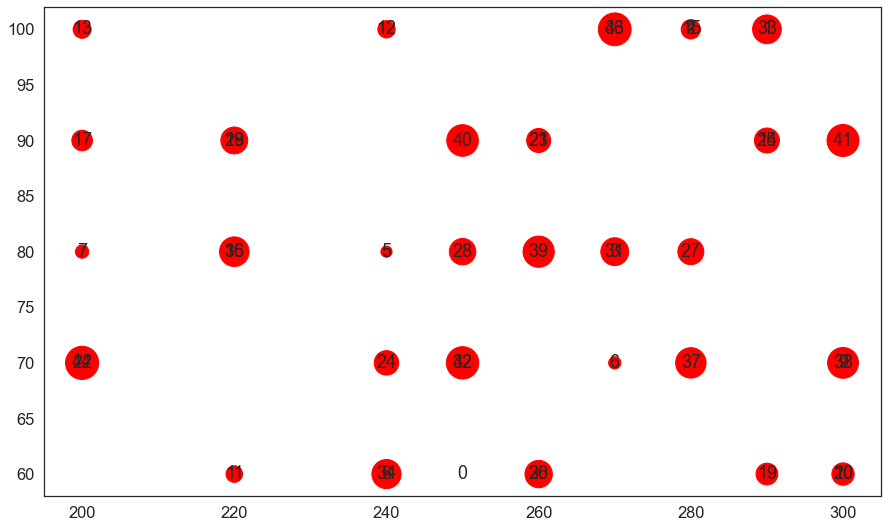

In [71]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [72]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[86.49892333]
[98.99914182]
[116.84818809]
[140.74074074]
[159.502465]
(118, 1)
[3.269]
[3.95]
[4.99]
[6.01]
[6.97]
(118, 1)
[118.075]
[125.525]
[132.715]
[138.9825]
[147.248]
(118, 1)
[99.08961195]
[100.]
[100.]
[100.]
[100.]
(118, 1)


In [73]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [74]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP45-pcp']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [75]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [76]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [77]:
dfq50_26.head()

,median26
0,106.849077
1,135.785000
2,155.403933
3,135.615400
4,138.996864


In [78]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [79]:
dfAllAverages.head()

,median26,median45,median85
0,106.849077,128.428364,126.823815
1,135.785000,127.953730,138.595818
2,155.403933,140.581831,132.610100
3,135.615400,128.507213,130.052720
4,138.996864,136.006907,138.716773


In [80]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[86.49892333]
[98.99914182]
[116.84818809]
[140.74074074]
[159.502465]
(118, 1)
*** RCP2.6***
[90.14453333]
[97.23038462]
[106.84907692]
[119.8765]
[139.98713793]
(118, 1)
*** RCP4.5***
[79.10468182]
[98.87703704]
[128.42836364]
[151.5455]
[167.89414815]
(118, 1)
*** RCP8.5***
[85.36320833]
[103.14303333]
[126.82381481]
[142.65486364]
[162.29]
(118, 1)


In [81]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[3.269]
[3.95]
[4.99]
[6.01]
[6.97]
(118, 1)
*** RCP2.6***
[3.37]
[3.84]
[4.37]
[5.53]
[6.29]
(118, 1)
*** RCP4.5***
[3.11]
[4.]
[5.37]
[6.41]
[7.25]
(118, 1)
*** RCP8.5***
[3.33]
[4.21]
[5.19]
[6.23]
[7.1]
(118, 1)


#### Set the parameters of making figure

In [82]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

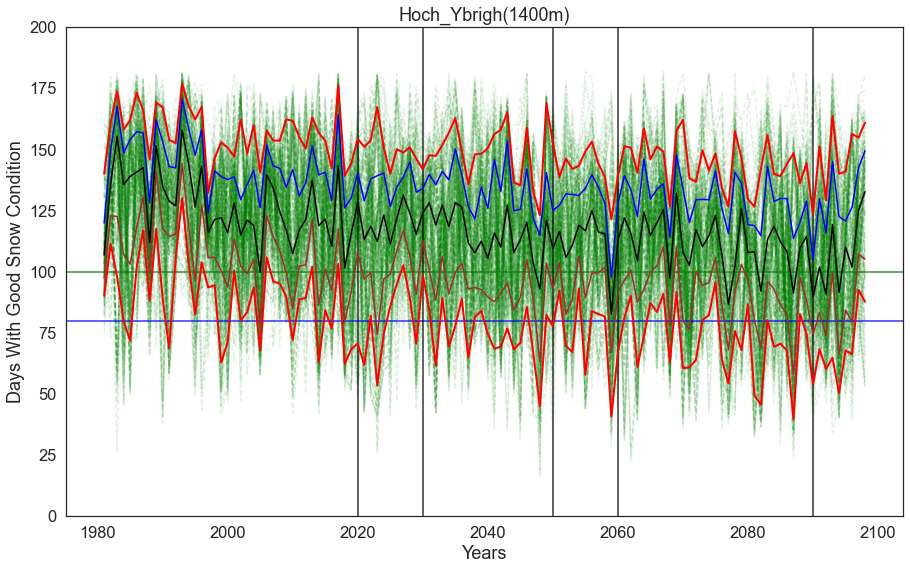

In [83]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

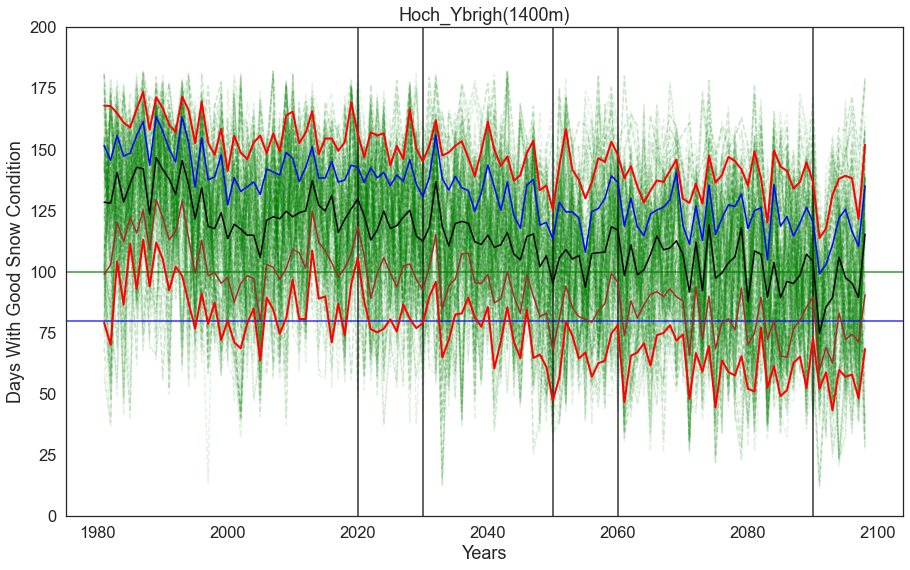

In [84]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

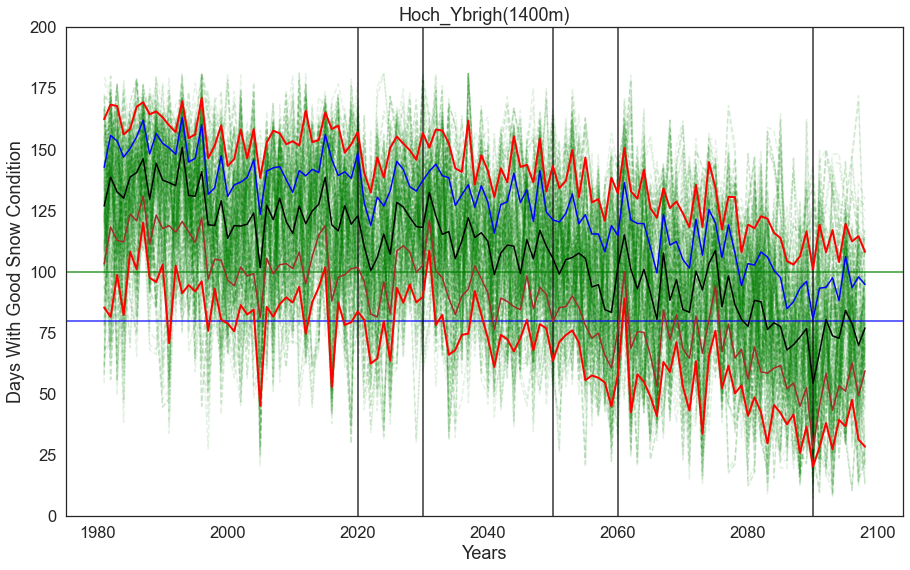

In [85]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [86]:
title_Figs = 'case6_Davos Jakobhorn, elv_b 2000m, RCP2.6'

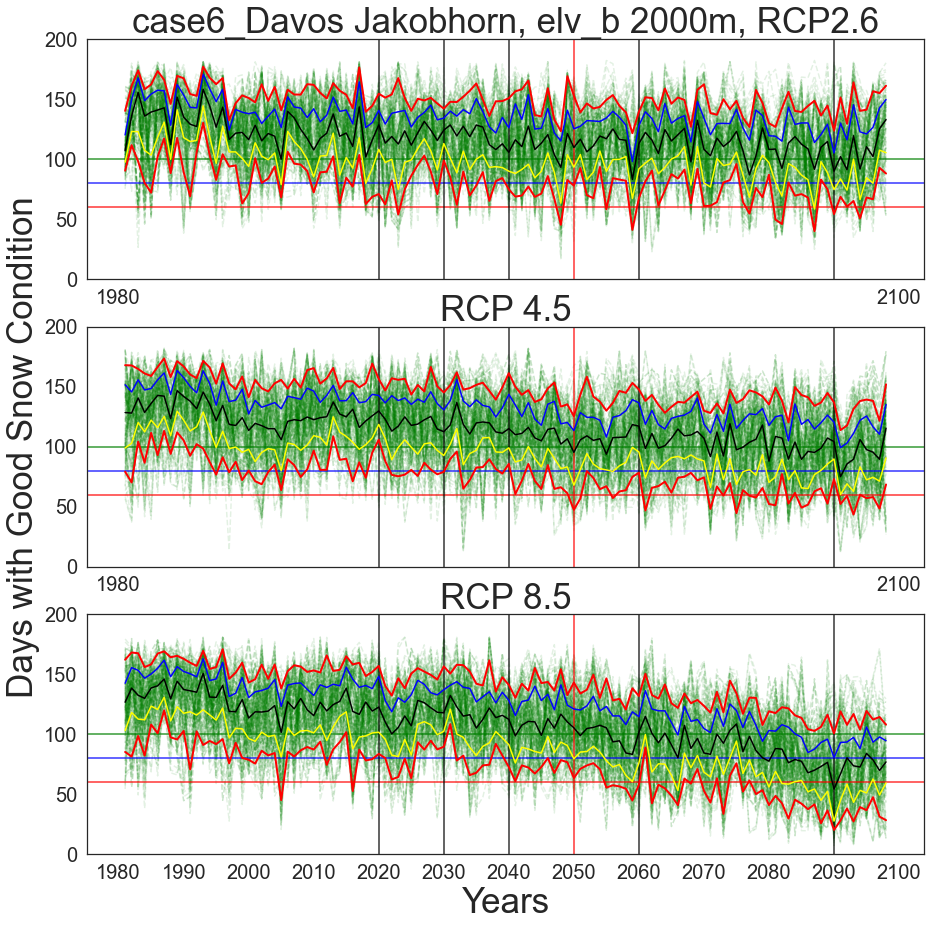

In [87]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

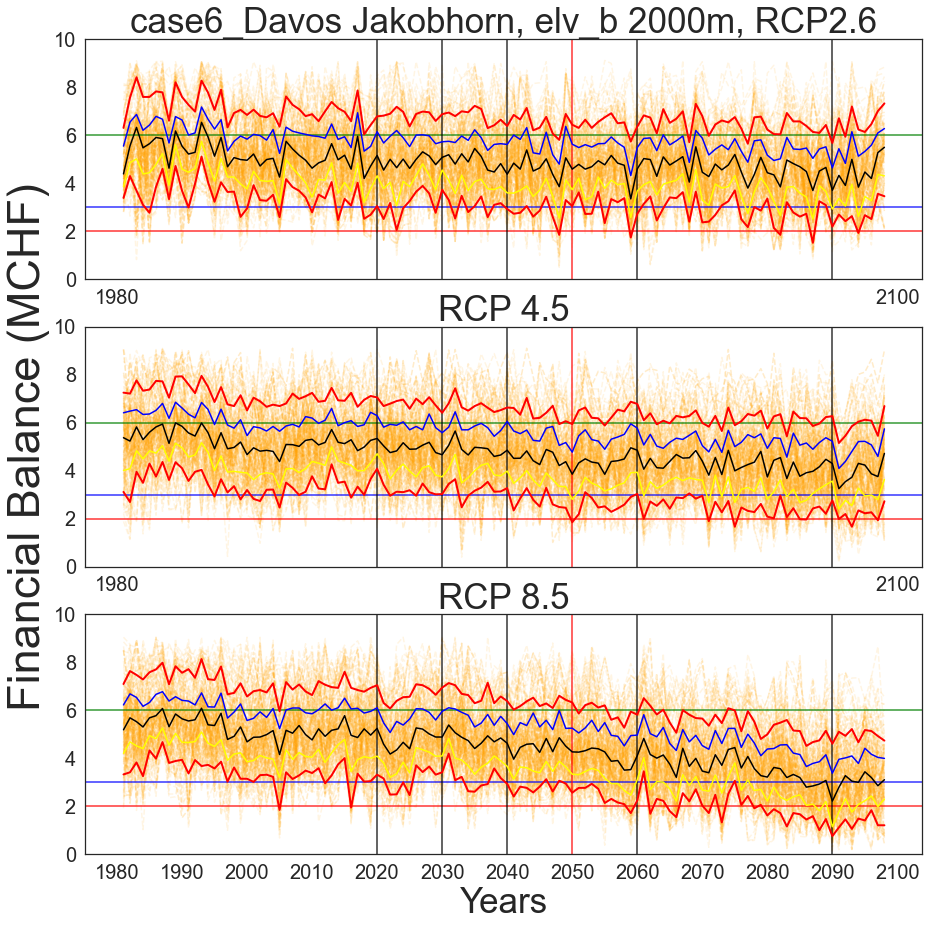

In [88]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

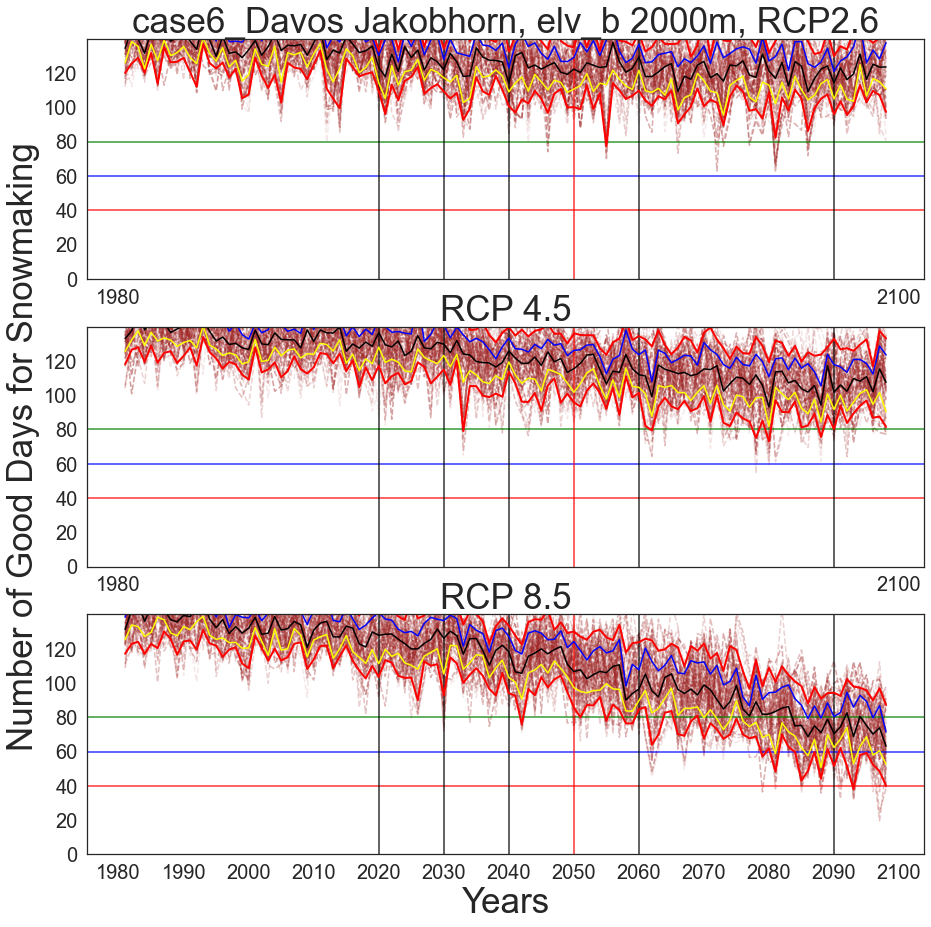

In [89]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

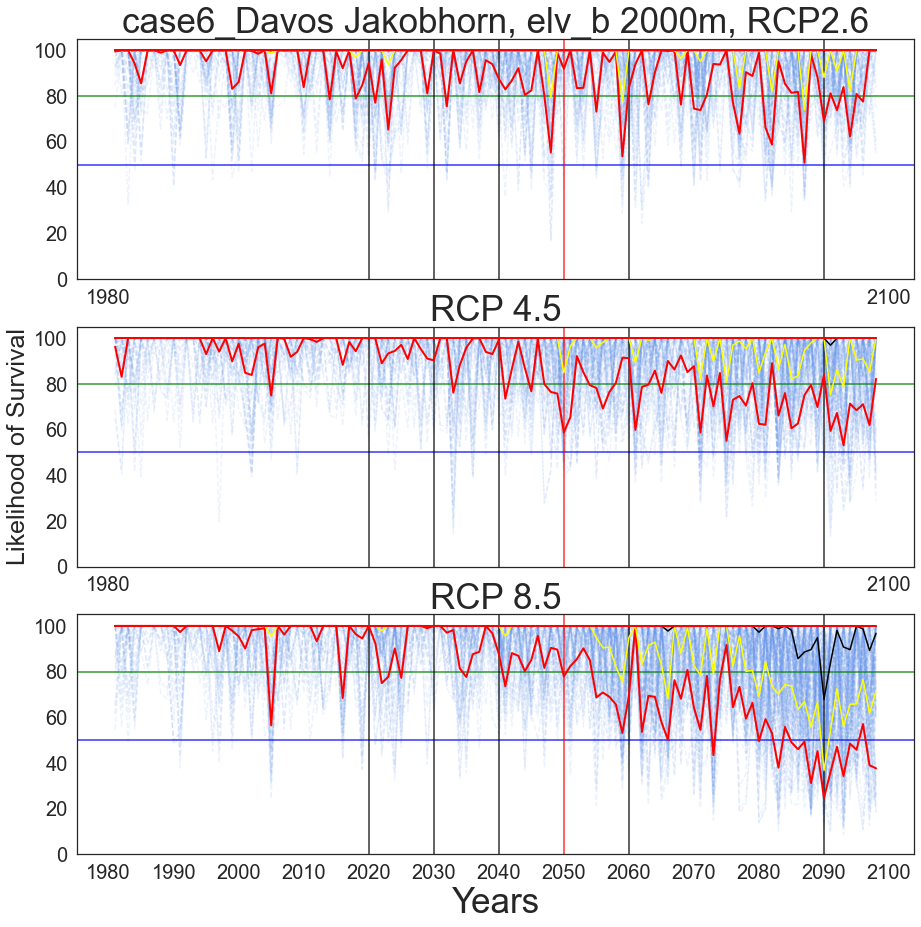

In [90]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [91]:
dfAllAverages.head()

,median26,median45,median85
0,106.849077,128.428364,126.823815
1,135.785000,127.953730,138.595818
2,155.403933,140.581831,132.610100
3,135.615400,128.507213,130.052720
4,138.996864,136.006907,138.716773


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [92]:
title_Figs2 = 'Davos Jakobhorn,2000m'

In [93]:
y_axis = np.arange(1981, 2100, step= 20)

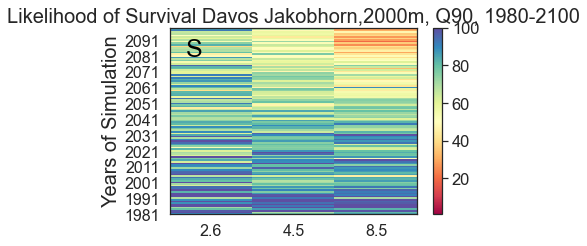

In [96]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'S', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

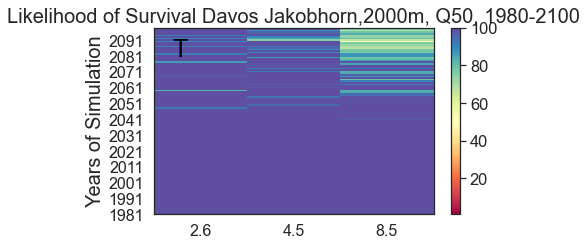

In [97]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'T', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

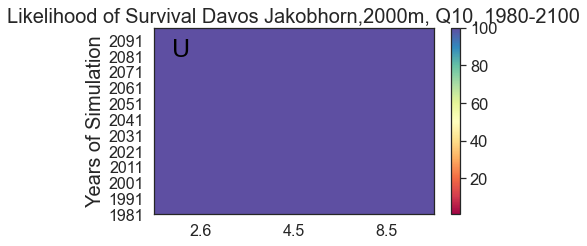

In [98]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'U', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [99]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
(9000, 119, 2)


In [100]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [101]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [102]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [103]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'], dtype='<U47')

In [104]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [105]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [106]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [107]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [108]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [109]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [110]:
df26_all_fin.head(7)

,Season,sc_1_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2_['Money_sc_26_12'],sc_3_['Money_sc_26_2'],sc_4_['Money_sc_26_4'],sc_5_['Money_sc_26_5'],sc_6_['Money_sc_26_4'],sc_7_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_8_['Money_sc_26_3'],sc_9_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_10_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_11_['Money_sc_26_8'],sc_12_['Money_sc_26_9'],sc_13_['Money_sc_26_4'],sc_14_['Money_sc_26_4'],sc_15_['Money_sc_26_7'],sc_16_['Money_sc_26_12'],sc_17_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_18_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_19_['Money_sc_26_10'],sc_20_['Money_sc_26_1'],sc_21_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_22_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_23_['Money_sc_26_4'],sc_24_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_25_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_26_['Money_sc_26_3'],sc_27_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_28_['Money_sc_26_3'],sc_29_['Money_sc_26_6'],sc_30_['Money_sc_26_9'],sc_31_['Money_sc_26_5'],sc_32_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_33_['Money_sc_26_4'],...,sc_2982_['Money_sc_26_4'],sc_2983_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2984_['Money_sc_26_2'],sc_2985_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2986_['Money_sc_26_6'],sc_2987_['Money_sc_26_9'],sc_2988_['Money_sc_26_5'],sc_2989_['Money_sc_26_12'],sc_2990_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2991_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2992_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2993_['Money_sc_26_9'],sc_2994_['Money_sc_26_10'],sc_2995_['Money_sc_26_1'],sc_2996_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2997_['Money_sc_26_4'],sc_2998_['Money_sc_26_7'],sc_2999_['Money_sc_26_9'],sc_3000_['Money_sc_26_10'],sc_3001_['Money_sc_26_8'],sc_3002_['Money_sc_26_4'],sc_3003_['Money_sc_26_10'],sc_3004_['Money_sc_26_7'],sc_3005_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3006_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3007_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3008_['Money_sc_26_2'],sc_3009_['Money_sc_26_11'],sc_3010_['Money_sc_26_6'],sc_3011_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3012_['Money_sc_26_5'],sc_3013_['Money_sc_26_9'],sc_3014_['Money_sc_26_9'],sc_3015_['Money_sc_26_3']
0,1981-1982,4.5000000000000036,4.530000000000004,4.140000000000003,6.340000000000005,4.940000000000004,4.760000000000003,4.720000000000003,4.4200000000000035,4.7700000000000005,4.720000000000003,5.200000000000004,5.640000000000001,6.310000000000005,5.020000000000004,4.170000000000003,4.990000000000004,4.530000000000002,5.370000000000004,4.490000000000004,4.360000000000002,4.510000000000003,4.510000000000003,6.310000000000005,4.7700000000000005,3.830000000000003,4.980000000000005,3.9100000000000033,5.100000000000006,4.5000000000000036,5.640000000000001,4.620000000000004,4.720000000000003,6.340000000000005,...,5.379999999999999,3.930000000000003,3.490000000000003,3.680000000000003,6.110000000000005,3.5700000000000003,4.470000000000003,3.7200000000000024,3.709999999999994,3.1699999999999937,4.5000000000000036,4.279999999999993,4.060000000000001,3.4899999999999993,4.150000000000003,6.2900000000000045,3.7700000000000014,4.279999999999993,4.640000000000001,3.1599999999999984,5.5600000000000005,4.640000000000001,3.7700000000000014,3.3700000000000028,3.7899999999999987,3.209999999999999,3.610000000000003,4.169999999999999,3.700000000000003,3.6200000000000023,4.519999999999998,4.279999999999993,4.279999999999993,3.769999999999991
1,1982-1983,5.290000000000004,5.740000000000005,6.280000000000005,6.220000000000005,5.650000000000005,3.3899999999999992,5.380000000000004,5.940000000000005,5.740000000000005,5.380000000000004,6.380000000000005,5.49,6.220000000000005,3.6799999999999984,5.500000000000004,5.420000000000004,4.990000000000004,6.460000000000005,6.200000000000005,4.560000000000003,6.550000000000005,6.550000000000005,6.220000000000005,5.390000000000004,5.950000000000005,7.2400000000000055,6.280000000000005,6.690000000000006,5.3

In [111]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [112]:
df45_all_fin.head(7)

,Season,sc_1_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_4_['Money_sc_45_22'],sc_5_['Money_sc_45_2'],sc_6_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_7_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_8_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_9_['Money_sc_45_20'],sc_10_['Money_sc_45_22'],sc_11_['Money_sc_45_8'],sc_12_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_13_['Money_sc_45_1'],sc_14_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_15_['Money_sc_45_8'],sc_16_['Money_sc_45_5'],sc_17_['Money_sc_45_2'],sc_18_['Money_sc_45_19'],sc_19_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_20_['Money_sc_45_22'],sc_21_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_22_['Money_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_23_['Money_sc_45_10'],sc_24_['Money_sc_45_11'],sc_25_['Money_sc_45_13'],sc_26_['Money_sc_45_1'],sc_27_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_28_['Money_sc_45_20'],sc_29_['Money_sc_45_24'],sc_30_['Money_sc_45_11'],sc_31_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_32_['Money_sc_45_24'],sc_33_['Money_sc_45_7'],...,sc_2937_['Money_sc_45_1'],sc_2938_['Money_sc_45_11'],sc_2939_['Money_sc_45_23'],sc_2940_['Money_sc_45_4'],sc_2941_['Money_sc_45_13'],sc_2942_['Money_sc_45_1'],sc_2943_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2944_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_2945_['Money_sc_45_11'],sc_2946_['Money_sc_45_22'],sc_2947_['Money_sc_45_24'],sc_2948_['Money_sc_45_20'],sc_2949_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2950_['Money_sc_45_10'],sc_2951_['Money_sc_45_15'],sc_2952_['Money_sc_45_7'],sc_2953_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_2954_['Money_sc_45_10'],sc_2955_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_2956_['Money_sc_45_14'],sc_2957_['Money_sc_45_5'],sc_2958_['Money_sc_45_8'],sc_2959_['Money_sc_45_12'],sc_2960_['Money_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_2961_['Money_sc_45_13'],sc_2962_['Money_sc_45_11'],sc_2963_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2964_['Money_sc_45_6'],sc_2965_['Money_sc_45_20'],sc_2966_['Money_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_2967_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2968_['Money_sc_45_9'],sc_2969_['Money_sc_45_10'],sc_2970_['Money_sc_45_22']
0,1981-1982,3.7600000000000002,4.640000000000003,3.880000000000002,5.890000000000005,6.170000000000004,6.970000000000006,6.450000000000005,3.2600000000000025,5.700000000000005,4.530000000000004,6.030000000000005,7.100000000000006,7.2400000000000055,6.720000000000005,4.940000000000004,6.710000000000005,6.100000000000005,4.760000000000003,5.160000000000005,4.530000000000004,4.549999999999999,5.610000000000004,3.9100000000000015,3.5600000000000014,4.490000000000002,7.2400000000000055,3.780000000000003,6.530000000000005,6.810000000000006,2.9700000000000006,5.230000000000004,6.200000000000005,5.910000000000005,...,7.080000000000005,2.329999999999999,4.400000000000003,6.810000000000006,6.000000000000004,2.2600000000000016,6.580000000000005,5.8400000000000025,4.889999999999996,3.4800000000000026,5.2900000000000045,5.670000000000002,3.7999999999999963,3.499999999999996,5.640000000000004,5.650000000000005,6.600000000000005,3.199999999999997,4.009999999999992,4.329999999999998,4.419999999999999,4.119999999999994,2.5499999999999985,5.060000000000004,6.000000000000004,2.329999999999999,5.600000000000004,6.970000000000006,5.0000000000000036,5.639999999999994,4.1700000000000035,4.190000000000003,3.2099999999999973,4.669999999999995
1,1982-1983,3.1900000000000026,2.780000000000002,3.2500000000000027,5.860000000000005,5.700000000000005,5.290000000000003,4.570000000000004,3.2500000000000027,5.920000000000004,2.6899999999999977,5.380000000000004,6.960000000000005,4.530000000000004,5.820000000000005,3.6699999999999933,6.030000000000005,3.690000000000003,6.060000000000005,5.640000000000004,2.6899999999999977,6.750000000000005,5.42,7.1600000000000055,2.0000000000000013,4.580000000000007,4.540000000000004,5.6200000000

In [113]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [114]:
df85_all_fin.head(7)

,Season,sc_1_['Money_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2_['Money_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_3_['Money_sc_85_17'],sc_4_['Money_sc_85_11'],sc_5_['Money_sc_85_26'],sc_6_['Money_sc_85_17'],sc_7_['Money_sc_85_12'],sc_8_['Money_sc_85_15'],sc_9_['Money_sc_85_10'],sc_10_['Money_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_11_['Money_sc_85_3'],sc_12_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_13_['Money_sc_85_5'],sc_14_['Money_sc_85_6'],sc_15_['Money_sc_85_2'],sc_16_['Money_sc_85_13'],sc_17_['Money_sc_85_30'],sc_18_['Money_sc_85_22'],sc_19_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_20_['Money_sc_85_23'],sc_21_['Money_sc_85_22'],sc_22_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_23_['Money_sc_85_6'],sc_24_['Money_sc_85_26'],sc_25_['Money_sc_85_6'],sc_26_['Money_sc_85_6'],sc_27_['Money_sc_85_29'],sc_28_['Money_sc_85_26'],sc_29_['Money_sc_85_12'],sc_30_['Money_sc_85_3'],sc_31_['Money_sc_85_12'],sc_32_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_33_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],...,sc_2982_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2983_['Money_sc_85_15'],sc_2984_['Money_sc_85_6'],sc_2985_['Money_sc_85_6'],sc_2986_['Money_sc_85_25'],sc_2987_['Money_sc_85_1'],sc_2988_['Money_sc_85_1'],sc_2989_['Money_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_2990_['Money_sc_85_18'],sc_2991_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2992_['Money_sc_85_4'],sc_2993_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2994_['Money_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_2995_['Money_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_2996_['Money_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_2997_['Money_sc_85_19'],sc_2998_['Money_sc_85_31'],sc_2999_['Money_sc_85_18'],sc_3000_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_3001_['Money_sc_85_1'],sc_3002_['Money_sc_85_2'],sc_3003_['Money_sc_85_6'],sc_3004_['Money_sc_85_5'],sc_3005_['Money_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_3006_['Money_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_3007_['Money_sc_85_15'],sc_3008_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_3009_['Money_sc_85_11'],sc_3010_['Money_sc_85_4'],sc_3011_['Money_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_3012_['Money_sc_85_20'],sc_3013_['Money_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_3014_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3015_['Money_SMHI-RCA-CCCMA-EUR44-RCP85-pcp']
0,1981-1982,7.050000000000006,7.090000000000005,5.490000000000001,5.570000000000004,6.530000000000005,6.130000000000004,5.570000000000004,5.170000000000004,5.760000000000004,5.5800000000000045,5.380000000000002,3.640000000000003,4.510000000000003,4.289999999999999,6.150000000000005,2.8500000000000023,3.790000000000003,5.6200000000000045,4.6700000000000035,5.420000000000001,4.020000000000002,4.850000000000004,5.730000000000005,5.120000000000004,4.849999999999999,5.530000000000005,6.060000000000004,5.120000000000004,5.570000000000004,5.380000000000002,5.570000000000004,5.760000000000004,3.640000000000003,...,3.220000000000001,4.4799999999999995,3.3299999999999996,4.289999999999997,2.4999999999999982,6.510000000000005,6.510000000000005,3.179999999999994,2.959999999999998,3.6200000000000023,4.899999999999999,6.580000000000005,5.470000000000004,5.800000000000003,2.9399999999999955,4.950000000000004,5.840000000000001,6.670000000000005,3.8199999999999936,3.0699999999999945,5.210000000000004,3.189999999999999,4.370000000000004,6.0400000000000045,4.219999999999995,5.170000000000004,6.610000000000005,4.870000000000004,4.899999999999999,5.470000000000004,3.439999999999992,6.0400000000000045,4.070000000000003,6.0400000000000045
1,1982-1983,6.760000000000005,6.9100000000000055,5.990000000000005,5.760000000000004,5.570000000000005,6.450000000000005,6.390000000000005,5.760000000000004,6.020000000000005,4.589999999999999,6.200000000000005,5.710000000000004,5.840000000000004,5.270000000000004,7.020000000000006,6.920000000000005,5.730000000000005,6.140000000000004,3.3400000000000025,6.730000000000005,3.9800000000000018,5.410000000000004,3.680000000000003,6.420000000000005,5.270000000000004,3.6500000

In [115]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [116]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2_['ArtSnowPossibility_sc_26_12'],sc_3_['ArtSnowPossibility_sc_26_2'],sc_4_['ArtSnowPossibility_sc_26_4'],sc_5_['ArtSnowPossibility_sc_26_5'],sc_6_['ArtSnowPossibility_sc_26_4'],sc_7_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_8_['ArtSnowPossibility_sc_26_3'],sc_9_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_10_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_11_['ArtSnowPossibility_sc_26_8'],sc_12_['ArtSnowPossibility_sc_26_9'],sc_13_['ArtSnowPossibility_sc_26_4'],sc_14_['ArtSnowPossibility_sc_26_4'],sc_15_['ArtSnowPossibility_sc_26_7'],sc_16_['ArtSnowPossibility_sc_26_12'],sc_17_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_18_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_19_['ArtSnowPossibility_sc_26_10'],sc_20_['ArtSnowPossibility_sc_26_1'],sc_21_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_22_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_23_['ArtSnowPossibility_sc_26_4'],sc_24_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_25_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_26_['ArtSnowPossibility_sc_26_3'],sc_27_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_28_['ArtSnowPossibility_sc_26_3'],sc_29_['ArtSnowPossibility_sc_26_6'],sc_30_['ArtSnowPossibility_sc_26_9'],sc_31_['ArtSnowPossibility_sc_26_5'],sc_32_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_33_['ArtSnowPossibility_sc_26_4'],...,sc_2982_['ArtSnowPossibility_sc_26_4'],sc_2983_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2984_['ArtSnowPossibility_sc_26_2'],sc_2985_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2986_['ArtSnowPossibility_sc_26_6'],sc_2987_['ArtSnowPossibility_sc_26_9'],sc_2988_['ArtSnowPossibility_sc_26_5'],sc_2989_['ArtSnowPossibility_sc_26_12'],sc_2990_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2991_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2992_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2993_['ArtSnowPossibility_sc_26_9'],sc_2994_['ArtSnowPossibility_sc_26_10'],sc_2995_['ArtSnowPossibility_sc_26_1'],sc_2996_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2997_['ArtSnowPossibility_sc_26_4'],sc_2998_['ArtSnowPossibility_sc_26_7'],sc_2999_['ArtSnowPossibility_sc_26_9'],sc_3000_['ArtSnowPossibility_sc_26_10'],sc_3001_['ArtSnowPossibility_sc_26_8'],sc_3002_['ArtSnowPossibility_sc_26_4'],sc_3003_['ArtSnowPossibility_sc_26_10'],sc_3004_['ArtSnowPossibility_sc_26_7'],sc_3005_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3006_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3007_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3008_['ArtSnowPossibility_sc_26_2'],sc_3009_['ArtSnowPossibility_sc_26_11'],sc_3010_['ArtSnowPossibility_sc_26_6'],sc_3011_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3012_['ArtSnowPossibility_sc_26_5'],sc_3013_['ArtSnowPossibility_sc_26_9'],sc_3014_['ArtSnowPossibility_sc_26_9'],sc_3015_['ArtSnowPossibility_sc_26_3']
0,1981-1982,153.29000000000005,143.08000000000004,113.93000000000002,130.37,138.56000000000003,133.57000000000002,153.29000000000005,117.84000000000002,134.44,147.42999999999998,120.05999999999997,132.88000000000002,130.87,126.11999999999999,147.13999999999996,129.39999999999998,128.64999999999998,138.1,144.29000000000002,150.47,139.72999999999993,140.82,131.60000000000002,140.42999999999998,137.48000000000002,115.59999999999998,129.27999999999997,122.44000000000003,124.03000000000002,136.26,149.04999999999995,142.20000000000002,140.30999999999995,...,130.62,137.47000000000003,121.41999999999996,125.68000000000002,134.69000000000003,117.94000000000001,149.04999999999995,151.13000000000005,135.53999999999996,136.67999999999998,142.20000000000002,137.15000000000003,138.94,138.17,146.55,140.30999999999995,135.41000000000003,116.74000000000005,153.26999999999998,123.5800

In [117]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [118]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_4_['ArtSnowPossibility_sc_45_22'],sc_5_['ArtSnowPossibility_sc_45_2'],sc_6_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_7_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_8_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_9_['ArtSnowPossibility_sc_45_20'],sc_10_['ArtSnowPossibility_sc_45_22'],sc_11_['ArtSnowPossibility_sc_45_8'],sc_12_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_13_['ArtSnowPossibility_sc_45_1'],sc_14_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_15_['ArtSnowPossibility_sc_45_8'],sc_16_['ArtSnowPossibility_sc_45_5'],sc_17_['ArtSnowPossibility_sc_45_2'],sc_18_['ArtSnowPossibility_sc_45_19'],sc_19_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_20_['ArtSnowPossibility_sc_45_22'],sc_21_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_22_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_23_['ArtSnowPossibility_sc_45_10'],sc_24_['ArtSnowPossibility_sc_45_11'],sc_25_['ArtSnowPossibility_sc_45_13'],sc_26_['ArtSnowPossibility_sc_45_1'],sc_27_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_28_['ArtSnowPossibility_sc_45_20'],sc_29_['ArtSnowPossibility_sc_45_24'],sc_30_['ArtSnowPossibility_sc_45_11'],sc_31_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_32_['ArtSnowPossibility_sc_45_24'],sc_33_['ArtSnowPossibility_sc_45_7'],...,sc_2937_['ArtSnowPossibility_sc_45_1'],sc_2938_['ArtSnowPossibility_sc_45_11'],sc_2939_['ArtSnowPossibility_sc_45_23'],sc_2940_['ArtSnowPossibility_sc_45_4'],sc_2941_['ArtSnowPossibility_sc_45_13'],sc_2942_['ArtSnowPossibility_sc_45_1'],sc_2943_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2944_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_2945_['ArtSnowPossibility_sc_45_11'],sc_2946_['ArtSnowPossibility_sc_45_22'],sc_2947_['ArtSnowPossibility_sc_45_24'],sc_2948_['ArtSnowPossibility_sc_45_20'],sc_2949_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2950_['ArtSnowPossibility_sc_45_10'],sc_2951_['ArtSnowPossibility_sc_45_15'],sc_2952_['ArtSnowPossibility_sc_45_7'],sc_2953_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_2954_['ArtSnowPossibility_sc_45_10'],sc_2955_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_2956_['ArtSnowPossibility_sc_45_14'],sc_2957_['ArtSnowPossibility_sc_45_5'],sc_2958_['ArtSnowPossibility_sc_45_8'],sc_2959_['ArtSnowPossibility_sc_45_12'],sc_2960_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_2961_['ArtSnowPossibility_sc_45_13'],sc_2962_['ArtSnowPossibility_sc_45_11'],sc_2963_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2964_['ArtSnowPossibility_sc_45_6'],sc_2965_['ArtSnowPossibility_sc_45_20'],sc_2966_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_2967_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2968_['ArtSnowPossibility_sc_45_9'],sc_2969_['ArtSnowPossibility_sc_45_10'],sc_2970_['ArtSnowPossibility_sc_45_22']
0,1981-1982,135.46,142.96,135.46,130.76000000000002,147.23999999999998,117.93999999999998,147.66,138.21,147.31999999999996,121.87,141.57000000000002,133.55999999999997,131.33999999999997,135.28999999999996,123.55000000000001,156.45,132.94,143.27999999999997,129.60000000000002,105.68999999999998,124.28000000000003,133.24,116.63000000000001,136.91000000000003,130.92000000000004,139.10999999999999,125.46000000000001,117.45999999999998,151.33,140.19000000000003,139.69999999999996,149.37999999999994,118.08999999999999,...,139.10999999999999,140.19000000000003,139.84999999999994,155.43999999999997,130.71999999999994,125.88999999999999,135.07999999999996,131.00999999999996,153.61,104.23000000000002,154.37,134.71,127.10000000000002,129.79000000000002,124.17999999999996,131.19000000000003,137.44,125.92000000000002,136.48,125.53999999999999,131.33,121.

In [119]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [120]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_3_['ArtSnowPossibility_sc_85_17'],sc_4_['ArtSnowPossibility_sc_85_11'],sc_5_['ArtSnowPossibility_sc_85_26'],sc_6_['ArtSnowPossibility_sc_85_17'],sc_7_['ArtSnowPossibility_sc_85_12'],sc_8_['ArtSnowPossibility_sc_85_15'],sc_9_['ArtSnowPossibility_sc_85_10'],sc_10_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_11_['ArtSnowPossibility_sc_85_3'],sc_12_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_13_['ArtSnowPossibility_sc_85_5'],sc_14_['ArtSnowPossibility_sc_85_6'],sc_15_['ArtSnowPossibility_sc_85_2'],sc_16_['ArtSnowPossibility_sc_85_13'],sc_17_['ArtSnowPossibility_sc_85_30'],sc_18_['ArtSnowPossibility_sc_85_22'],sc_19_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_20_['ArtSnowPossibility_sc_85_23'],sc_21_['ArtSnowPossibility_sc_85_22'],sc_22_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_23_['ArtSnowPossibility_sc_85_6'],sc_24_['ArtSnowPossibility_sc_85_26'],sc_25_['ArtSnowPossibility_sc_85_6'],sc_26_['ArtSnowPossibility_sc_85_6'],sc_27_['ArtSnowPossibility_sc_85_29'],sc_28_['ArtSnowPossibility_sc_85_26'],sc_29_['ArtSnowPossibility_sc_85_12'],sc_30_['ArtSnowPossibility_sc_85_3'],sc_31_['ArtSnowPossibility_sc_85_12'],sc_32_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_33_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],...,sc_2982_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2983_['ArtSnowPossibility_sc_85_15'],sc_2984_['ArtSnowPossibility_sc_85_6'],sc_2985_['ArtSnowPossibility_sc_85_6'],sc_2986_['ArtSnowPossibility_sc_85_25'],sc_2987_['ArtSnowPossibility_sc_85_1'],sc_2988_['ArtSnowPossibility_sc_85_1'],sc_2989_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_2990_['ArtSnowPossibility_sc_85_18'],sc_2991_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2992_['ArtSnowPossibility_sc_85_4'],sc_2993_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2994_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_2995_['ArtSnowPossibility_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_2996_['ArtSnowPossibility_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_2997_['ArtSnowPossibility_sc_85_19'],sc_2998_['ArtSnowPossibility_sc_85_31'],sc_2999_['ArtSnowPossibility_sc_85_18'],sc_3000_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_3001_['ArtSnowPossibility_sc_85_1'],sc_3002_['ArtSnowPossibility_sc_85_2'],sc_3003_['ArtSnowPossibility_sc_85_6'],sc_3004_['ArtSnowPossibility_sc_85_5'],sc_3005_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_3006_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_3007_['ArtSnowPossibility_sc_85_15'],sc_3008_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_3009_['ArtSnowPossibility_sc_85_11'],sc_3010_['ArtSnowPossibility_sc_85_4'],sc_3011_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_3012_['ArtSnowPossibility_sc_85_20'],sc_3013_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_3014_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3015_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP85-pcp']
0,1981-1982,134.09,134.09,131.61999999999998,110.81000000000002,126.91000000000001,134.86999999999998,153.79,121.63999999999999,144.46999999999997,131.32000000000005,132.83,136.06,144.45999999999995,132.05000000000004,122.73999999999997,122.87000000000002,117.07999999999998,126.91000000000001,136.10000000000002,116.75000000000001,135.79,138.87000000000003,127.83,130.51000000000005,133.41,129.18000000000004,126.18999999999998,131.63,148.87,130.98999999999998,144.95000000000002,138.51,131.51,...,135.63000000000005,121.63999999999999,132.05000000000004,133.41,108.7,135.23999999999998,127.99000000000001,138.31,146.77000000000004,138.41000000000003,124.43000000000002,131.01,114.17999999999999,130.41,125.32000000000002,146.63,130.77,136.95000000000005,140.33999999999997,141.57000000000002,124.79999999999998,130.85,148.39999999999998,

### Survival Map CH2018 RCP2.6

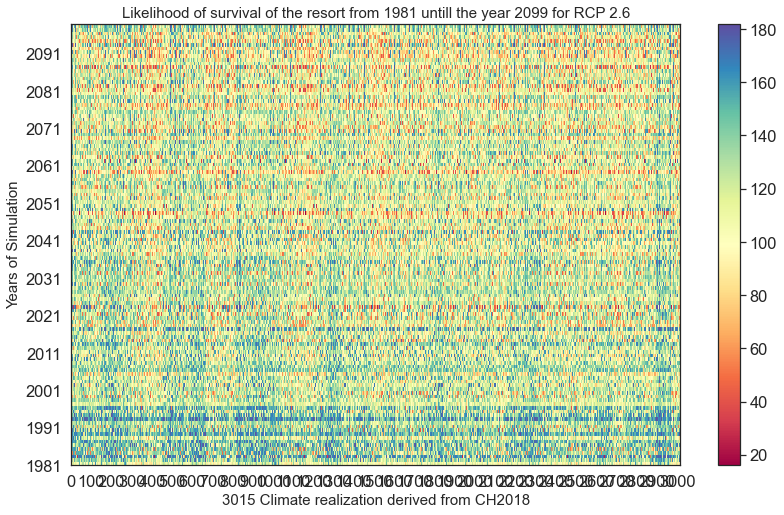

In [121]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

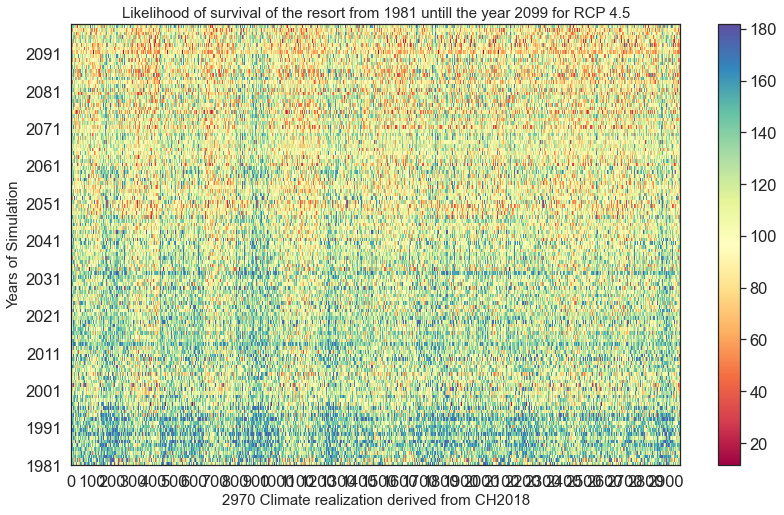

In [122]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

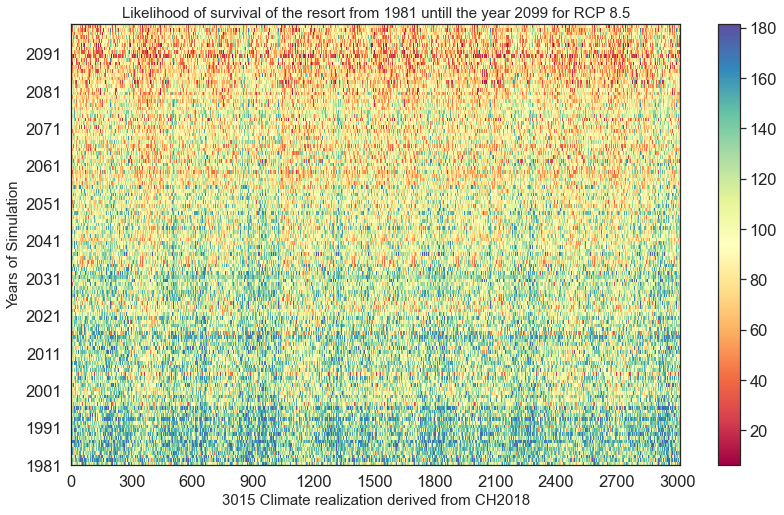

In [123]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [124]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [125]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [126]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [127]:
df26_all.shape

(118, 3016)

In [128]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [129]:
type(df26_all)

pandas.core.frame.DataFrame

In [130]:
thresholds_85_sce_m

array([  0,   5,  13, ..., 192, 194, 198], dtype=int64)

In [131]:
thresholds_45_sce_m

array([  1,   4,   7, ..., 188, 190, 195], dtype=int64)

In [132]:
df26_allColumns = df26_all.columns

In [133]:
df26_all[df26_allColumns[1]].iloc[0]

'110.60467999999999'

In [134]:
df26_all.head()

,Season,sc_1_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2_['isOverSnow_sc_26_12'],sc_3_['isOverSnow_sc_26_2'],sc_4_['isOverSnow_sc_26_4'],sc_5_['isOverSnow_sc_26_5'],sc_6_['isOverSnow_sc_26_4'],sc_7_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_8_['isOverSnow_sc_26_3'],sc_9_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_11_['isOverSnow_sc_26_8'],sc_12_['isOverSnow_sc_26_9'],sc_13_['isOverSnow_sc_26_4'],sc_14_['isOverSnow_sc_26_4'],sc_15_['isOverSnow_sc_26_7'],sc_16_['isOverSnow_sc_26_12'],sc_17_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_18_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_19_['isOverSnow_sc_26_10'],sc_20_['isOverSnow_sc_26_1'],sc_21_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_22_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_23_['isOverSnow_sc_26_4'],sc_24_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_25_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_26_['isOverSnow_sc_26_3'],sc_27_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_28_['isOverSnow_sc_26_3'],sc_29_['isOverSnow_sc_26_6'],sc_30_['isOverSnow_sc_26_9'],sc_31_['isOverSnow_sc_26_5'],sc_32_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_33_['isOverSnow_sc_26_4'],...,sc_2982_['isOverSnow_sc_26_4'],sc_2983_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2984_['isOverSnow_sc_26_2'],sc_2985_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2986_['isOverSnow_sc_26_6'],sc_2987_['isOverSnow_sc_26_9'],sc_2988_['isOverSnow_sc_26_5'],sc_2989_['isOverSnow_sc_26_12'],sc_2990_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2991_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2992_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2993_['isOverSnow_sc_26_9'],sc_2994_['isOverSnow_sc_26_10'],sc_2995_['isOverSnow_sc_26_1'],sc_2996_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2997_['isOverSnow_sc_26_4'],sc_2998_['isOverSnow_sc_26_7'],sc_2999_['isOverSnow_sc_26_9'],sc_3000_['isOverSnow_sc_26_10'],sc_3001_['isOverSnow_sc_26_8'],sc_3002_['isOverSnow_sc_26_4'],sc_3003_['isOverSnow_sc_26_10'],sc_3004_['isOverSnow_sc_26_7'],sc_3005_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3006_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3007_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3008_['isOverSnow_sc_26_2'],sc_3009_['isOverSnow_sc_26_11'],sc_3010_['isOverSnow_sc_26_6'],sc_3011_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3012_['isOverSnow_sc_26_5'],sc_3013_['isOverSnow_sc_26_9'],sc_3014_['isOverSnow_sc_26_9'],sc_3015_['isOverSnow_sc_26_3']
0,1981-1982,110.60467999999999,106.55879166666665,101.24750000000003,152.71320833333334,109.25679166666679,112.42647999999998,112.73900000000003,101.74012499999999,113.83345833333337,112.73900000000003,122.65374999999997,130.76995833333325,152.48679166666665,119.85439999999997,100.47658333333328,118.11224999999999,108.13733333333325,123.44754166666672,107.73204000000004,103.73804166666672,110.49624999999999,110.49624999999999,152.59083333333334,113.83345833333337,94.10558333333336,110.98387499999994,90.26354166666668,111.14158333333327,106.02545833333329,130.76995833333325,114.56729166666665,112.73900000000003,153.31295833333334,...,140.75989285714292,103.0972857142857,90.53278571428571,95.67710714285715,156.69010714285716,91.91850000000004,112.74460000000002,97.46778571428571,92.36600000000011,77.59160714285723,110.60467999999999,115.52853571428577,100.97678571428571,92.45135714285716,104.95789285714285,151.4496,91.49332142857145,115.52853571428577,120.24939285714287,84.6393571428571,142.44414285714288,120.24939285714287,91.49332142857145,86.00278571428572,96.52167857142854,82.77246428571422,94.16042857142857,104.72796428571431,92.76225000000004,93.02267857142856,120.33642857142863,115.52853571428577,115.52853571428577,94.26325000000008
1,1982-1983,130.1754,139.006125,150.74270833333333,149.24612499999995,131.615,80.82636000000004,131.91608333333335,140.36129166666672,135.31629166666664,130.

In [135]:
thresholds_45_sce_m.shape

(2970,)

In [136]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
60.0
0
48


In [137]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [138]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [139]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [140]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

2748
2505
2108


In [141]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

2748
2505
2108


In [142]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

2748
2505
2108


In [143]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

3016
2971
3016


In [144]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

3015
2970
3015


In [145]:
type(T1RCP85)

numpy.ndarray

In [146]:
T1RCP85.shape

(3016,)

In [147]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [148]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [149]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,0.0,0,2,0.0,0.0,1.0,2.0,0.0,0.0
1,0.0,0,3,0.0,0.0,4.0,2.0,0.0,5.0
2,0.0,0,6,0.0,0.0,7.0,0.0,0.0,13.0
3,0.0,0,8,0.0,0.0,9.0,0.0,0.0,17.0
4,0.0,0,10,0.0,0.0,12.0,1.0,0.0,18.0
5,0.0,0,11,0.0,0.0,15.0,1.0,0.0,19.0
6,0.0,0,14,0.0,0.0,16.0,3.0,0.0,20.0
7,0.0,0,23,0.0,0.0,24.0,0.0,0.0,21.0
8,0.0,0,28,0.0,0.0,25.0,3.0,0.0,22.0
9,0.0,0,33,0.0,0.0,29.0,2.0,0.0,26.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [150]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [151]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 2970
The lengthe of X is: 2970
***
The lengthe of Y is: 3015
The lengthe of X is: 3015


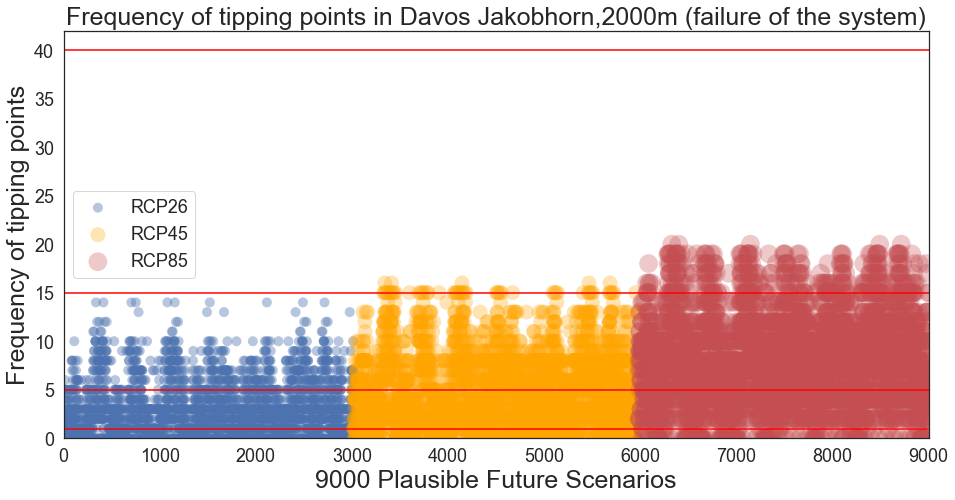

In [152]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

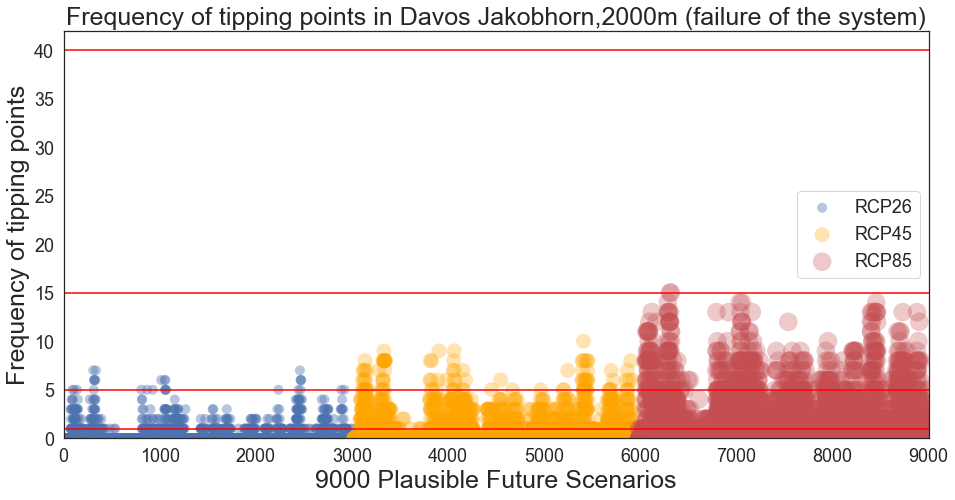

In [153]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

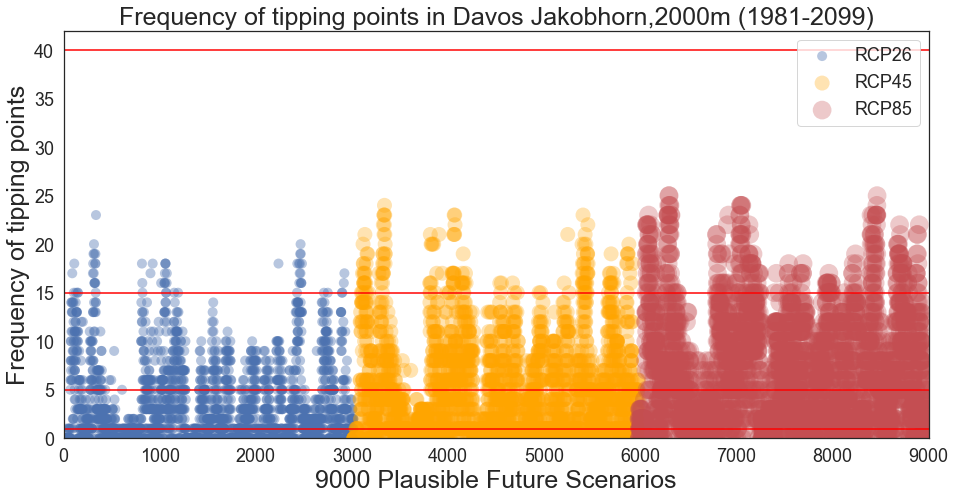

In [154]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [155]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,250.0,60.0,1,0,UZHModel,135.615688,14,86.230240,78.721920,143.646760,126.554000,134.682240,160.587880,173.879280,154.632040,159.911320,163.547320,162.956720,148.279360,171.724520,130.243000,139.303640,155.140400,117.477920,158.829200,173.165000,74.759960,...,144.938560,129.860480,111.431400,120.373480,131.982800,153.867720,143.380440,104.011240,139.641240,149.640400,157.002920,144.376840,106.577800,155.122720,94.250000,160.328840,122.499040,126.748280,77.660520,149.845080,127.851440,163.420400,104.977720,109.142200,124.586160,129.445320,137.451880,151.992960,118.448720,157.470480,128.146017,5.550932,0.847458,0.0
201,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,290.0,100.0,1,1,UZHModel,127.485883,14,74.336414,70.869207,133.250034,118.022759,124.770034,152.917552,169.205448,148.904448,153.481793,156.067793,147.685759,143.827276,169.562966,127.588793,130.757793,145.234069,112.340793,149.353724,165.824000,65.777897,...,138.009138,121.587655,98.359517,111.170586,119.729966,148.764586,136.270897,94.285793,127.326034,146.006207,149.265586,136.683310,98.196483,151.361586,87.215345,156.501138,109.050655,118.801138,66.948724,144.513034,120.388517,157.845172,99.308414,95.915276,107.976414,125.676000,128.602034,147.446621,107.438897,156.330414,128.146017,4.901864,0.823297,1.0
401,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,280.0,100.0,1,2,UZHModel,129.518825,14,76.991286,72.912679,135.666929,120.067929,127.444786,154.700321,170.355643,150.191857,155.594464,157.963071,151.217250,145.032607,170.146893,128.181250,132.873750,147.535714,113.638536,151.902000,168.105571,67.984250,...,139.701821,123.845643,101.426929,113.255643,122.651571,149.982036,138.087500,96.653286,130.403036,146.858071,151.537393,138.529143,100.283571,152.338786,88.980643,157.391000,112.739571,120.740393,69.339750,145.751393,122.080964,159.089643,100.637857,99.286786,111.832714,126.704643,130.802107,148.602357,109.967571,156.627929,128.146017,5.080000,0.826018,1.0
601,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,270.0,80.0,1,3,UZHModel,131.556708,14,79.842815,74.895778,138.193148,122.230481,129.985481,156.581704,171.591037,151.569333,157.487370,159.990370,154.994333,146.175222,170.633815,128.817593,134.982519,149.999630,114.849926,154.184370,170.101000,70.351370,...,141.438000,125.772333,104.610704,115.487333,125.665407,151.228481,139.883815,99.000111,133.497667,147.741111,153.807778,140.489889,102.405185,153.264481,90.824074,158.311481,116.384444,122.651519,71.907889,147.075519,123.898778,160.426296,101.994815,102.628519,115.928444,127.693704,133.165148,149.776630,112.652704,156.915333,128.146017,5.245847,0.841519,0.0
801,1.143825,974.46393,5.723522,-1.477778,0.950589,0.101839,2.0,280.0,100.0,1,4,UZHModel,129.518825,14,76.991286,72.912679,135.666929,120.067929,127.444786,154.700321,170.355643,150.191857,155.594464,157.963071,151.217250,145.032607,170.146893,128.181250,132.873750,147.535714,113.638536,151.902000,168.105571,67.984250,...,139.701821,123.845643,101.426929,113.255643,122.651571,149.982036,138.087500,96.653286,130.403036,146.858071,151.537393,138.529143,100.283571,152.338786,88.980643,157.391000,112.739571,120.740393,69.339750,145.751393,122.080964,159.089643,100.637857,99.286786,111.832714,126.704643,130.802107,148.602357,109.967571,156.627929,128.146017,5.080000

In [214]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [156]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

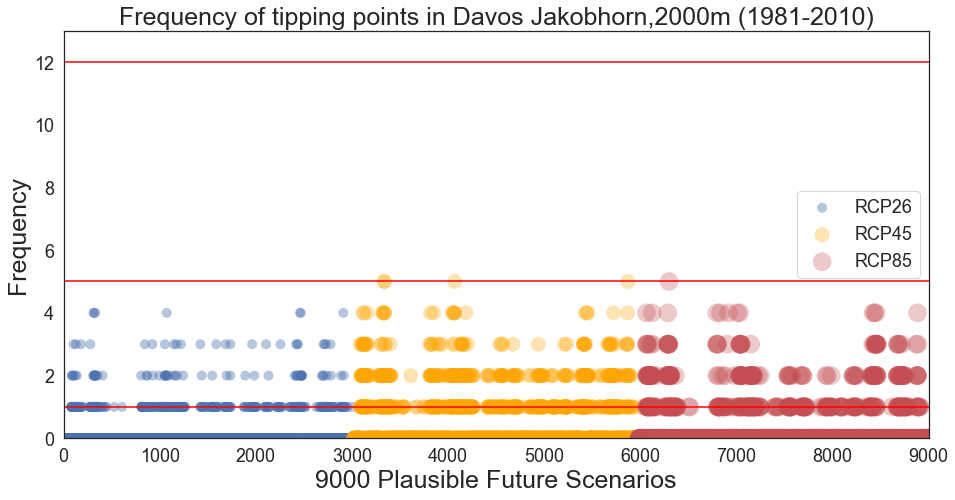

In [157]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [158]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [159]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [215]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [161]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    2518
1.0     408
2.0      59
3.0      24
4.0       7
Name: tippingPoint26_1980, dtype: int64
0.0    2304
1.0     380
2.0     204
3.0      58
4.0      21
5.0       4
Name: tippingPoint45_1980, dtype: int64
0.0    2585
1.0     241
2.0     133
3.0      44
4.0      12
5.0       1
Name: tippingPoint85_1980, dtype: int64


In [162]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    2517
1.0     408
2.0      59
3.0      24
4.0       7
Name: tippingPoint26_1_1980, dtype: int64
0.0    2303
1.0     380
2.0     204
3.0      58
4.0      21
5.0       4
Name: tippingPoint45_1_1980, dtype: int64
0.0    2584
1.0     241
2.0     133
3.0      44
4.0      12
5.0       1
Name: tippingPoint85_1_1980, dtype: int64


In [163]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario26_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
16    66
14    66
12    66
10    66
8     66
6     66
4     66
2     66
40    66
44    66
41    66
1     66
39    66
37    66
35    66
33    66
31    66
29    66
27    66
25    66
23    66
21    66
19    66
17    66
15    66
13    66
11    66
9     66
7     66
5     66
3     66
0     66
Name: scenario45_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
1

In [164]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

199    45
104    45
176    45
172    45
168    45
156    45
154    45
152    45
150    45
144    45
136    45
134    45
120    45
116    45
110    45
106    45
96     45
180    45
94     45
76     45
74     45
70     45
68     45
66     45
64     45
58     45
40     45
28     45
14     45
10     45
8      45
6      45
178    45
184    45
197    45
117    45
193    45
183    45
181    45
177    45
173    45
169    45
167    45
165    45
161    45
149    45
143    45
133    45
125    45
123    45
111    45
196    45
101    45
95     45
89     45
87     45
85     45
83     45
71     45
51     45
49     45
37     45
33     45
23     45
11     45
3      45
2      45
Name: policy26_1980, dtype: int64
195    45
92     45
190    45
188    45
170    45
164    45
162    45
160    45
158    45
146    45
142    45
124    45
118    45
114    45
108    45
100    45
88     45
187    45
86     45
84     45
80     45
78     45
72     45
62     45
60     45
56     45
52     45
44     45
36     45
24    

In [219]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 3, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 3, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 3, thresholds_85_sce_m)

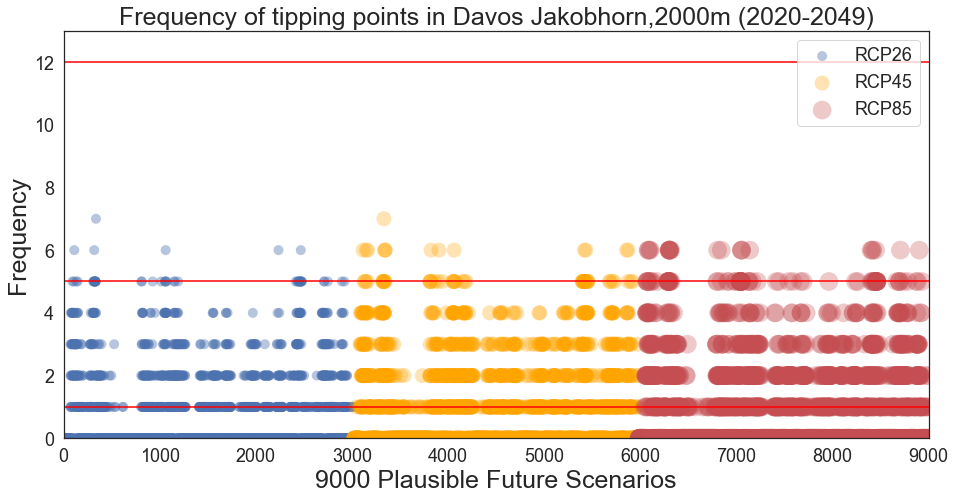

In [220]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [221]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [216]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [222]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

0.0    1911
1.0     503
2.0     320
3.0     145
4.0      88
5.0      43
6.0       5
7.0       1
Name: tippingPoint26_2020, dtype: int64
0.0    1846
1.0     543
2.0     269
3.0     149
4.0     103
5.0      47
6.0      13
7.0       1
Name: tippingPoint45_2020, dtype: int64
0.0    1868
1.0     403
2.0     382
3.0     175
4.0      86
5.0      79
6.0      23
Name: tippingPoint85_2020, dtype: int64


In [223]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

0.0    1910
1.0     503
2.0     320
Name: tippingPoint26_1_2020, dtype: int64
0.0    1845
1.0     543
2.0     269
Name: tippingPoint45_1_2020, dtype: int64
0.0    1867
1.0     403
2.0     382
Name: tippingPoint85_1_2020, dtype: int64


In [224]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

44    67
9     67
6     67
8     67
10    67
20    67
22    67
24    67
26    67
28    67
30    67
32    67
34    67
38    67
42    67
3     67
0     67
11    67
19    67
39    67
37    67
35    67
27    67
7     66
14    66
31    66
16    66
5     64
21    64
13    61
41    60
23    60
33    58
18    58
2     58
43    57
25    56
29    55
12    52
17    47
15    43
40    41
1     35
4     33
36    26
Name: scenario26_2020, dtype: int64
0     66
7     66
11    66
3     66
42    66
38    66
19    66
34    66
32    66
30    66
26    66
22    66
20    66
10    66
8     66
9     66
24    65
6     65
44    65
39    65
27    65
37    64
14    64
28    64
35    62
31    62
5     61
16    61
21    60
18    59
41    58
13    57
2     56
23    55
25    55
29    54
33    51
12    51
43    49
17    48
40    47
15    41
1     39
4     33
36    25
Name: scenario45_2020, dtype: int64
44    67
11    67
8     67
10    67
20    67
24    67
26    67
30    67
32    67
34    67
38    67
42    67
3     67
9

In [225]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

193    44
177    44
123    44
184    43
136    43
71     43
176    43
117    43
89     43
76     43
70     43
96     42
85     42
106    42
116    42
150    42
14     42
10     42
3      42
6      42
104    42
199    42
87     42
95     42
165    42
125    42
154    41
8      41
181    41
66     41
74     41
167    41
94     41
134    41
83     41
2      41
101    41
11     41
197    41
37     41
183    40
173    40
178    40
152    40
180    40
40     40
196    40
120    40
143    40
64     40
68     40
169    40
111    39
172    39
161    39
110    39
144    39
156    39
168    39
23     38
33     38
149    38
58     38
28     38
133    38
49     36
51     36
Name: policy26_2020, dtype: int64
108    43
115    43
29     43
91     43
162    42
84     42
80     42
100    42
62     42
77     42
81     42
52     42
72     42
151    42
159    42
141    42
78     41
164    41
9      41
15     41
121    41
160    41
31     41
41     41
119    41
188    41
57     41
135    41
88     41
99    

In [226]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 3, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 3, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 3, thresholds_85_sce_m)

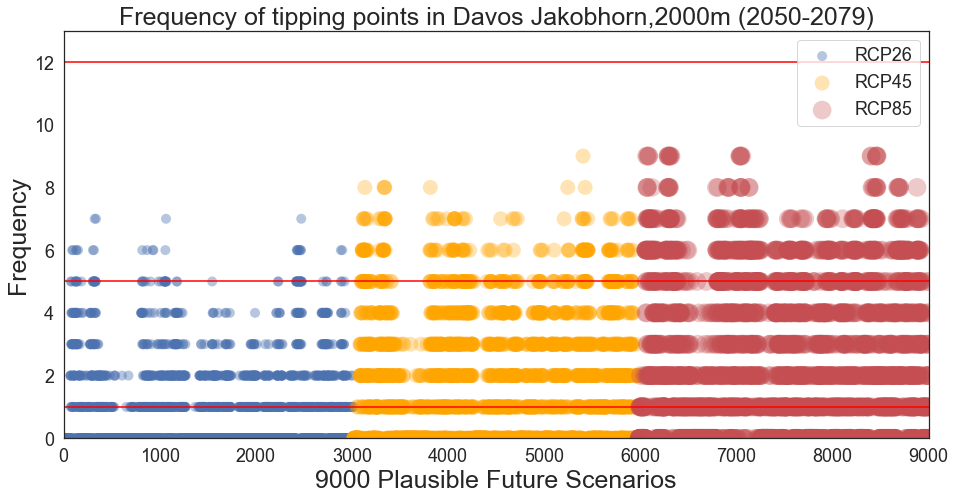

In [227]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [228]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [229]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [230]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

0.0    1772
1.0     527
2.0     373
3.0     147
4.0     104
5.0      67
6.0      22
7.0       4
Name: tippingPoint26_2050, dtype: int64
0.0    1390
1.0     424
3.0     321
2.0     315
4.0     211
5.0     162
6.0      97
7.0      43
8.0       7
9.0       1
Name: tippingPoint45_2050, dtype: int64
0.0    858
1.0    511
2.0    357
6.0    305
4.0    276
5.0    273
3.0    251
7.0    128
8.0     35
9.0     22
Name: tippingPoint85_2050, dtype: int64


In [231]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

0.0    1771
1.0     527
2.0     373
Name: tippingPoint26_1_2050, dtype: int64
0.0    1389
1.0     424
2.0     315
Name: tippingPoint45_1_2050, dtype: int64
0.0    857
1.0    511
2.0    357
Name: tippingPoint85_1_2050, dtype: int64


In [232]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

44    67
28    67
3     67
42    67
38    67
34    67
32    67
30    67
26    67
9     67
24    67
22    67
20    67
10    67
8     67
6     67
7     67
0     67
11    67
19    67
39    67
37    67
35    67
27    67
16    66
5     65
31    65
21    64
41    63
14    62
18    62
13    60
25    57
29    57
23    56
33    53
2     52
43    50
12    45
15    43
17    39
40    32
4     29
1     28
36    15
Name: scenario26_2050, dtype: int64
0     66
19    66
8     66
20    66
26    66
30    66
34    66
10    65
38    65
9     65
11    65
42    64
44    64
7     63
32    63
27    62
24    62
3     62
6     57
22    56
14    53
37    53
39    52
28    48
35    48
21    39
31    38
5     37
16    37
13    36
18    35
25    34
2     34
41    33
23    32
43    31
33    28
17    28
15    27
12    26
29    26
40    24
1     22
4     19
36    13
Name: scenario45_2050, dtype: int64
0     67
19    67
26    67
8     66
9     65
30    65
34    64
10    62
20    62
11    60
44    59
32    56
38    56
4

In [233]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

106    43
94     43
177    43
184    42
167    42
178    42
83     42
101    42
150    42
165    41
89     41
96     41
116    41
193    41
71     41
176    41
134    41
95     41
74     41
70     41
133    41
66     41
149    41
156    40
10     40
168    40
154    40
136    40
120    40
196    40
49     40
104    40
14     40
58     40
51     40
173    40
76     40
144    40
123    40
125    40
87     40
110    39
28     39
199    39
152    39
33     39
183    39
181    39
172    39
111    39
117    39
23     39
11     39
197    39
180    39
37     38
85     38
68     38
143    38
64     38
161    38
40     38
169    38
6      38
8      37
2      36
3      35
Name: policy26_2050, dtype: int64
107    38
141    38
44     37
29     37
175    36
151    36
100    36
121    36
78     36
52     35
84     35
31     35
62     35
92     35
114    34
77     34
91     34
160    34
119    34
127    34
60     34
179    34
86     33
72     33
59     33
88     33
53     33
108    33
124    33
7     

In [235]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 3, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 3, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 3, thresholds_85_sce_m)

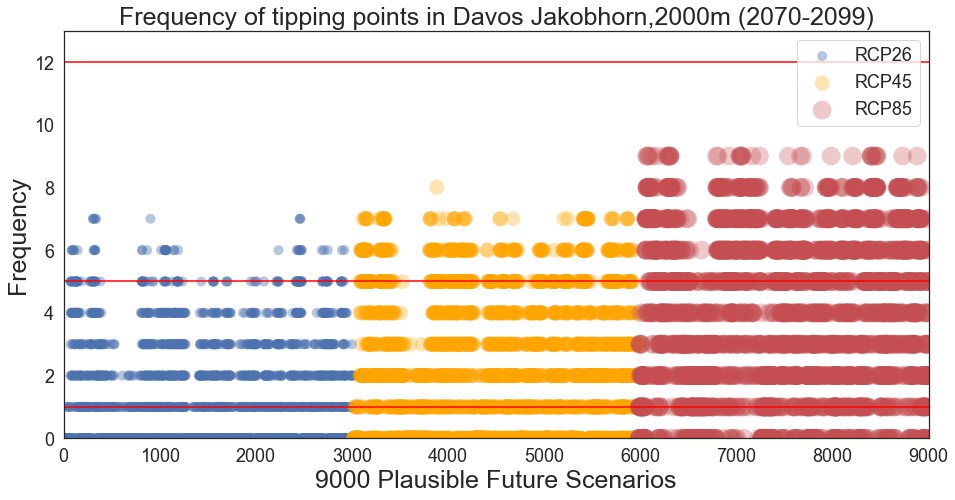

In [236]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [237]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [238]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [186]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

0.0    1617
1.0     397
2.0     375
3.0     251
4.0     202
5.0     124
6.0      41
7.0       9
Name: tippingPoint26_2070, dtype: int64
0.0    1054
2.0     416
1.0     381
3.0     320
5.0     282
4.0     242
6.0     212
7.0      63
8.0       1
Name: tippingPoint45_2070, dtype: int64
6.0    440
2.0    438
5.0    376
7.0    369
3.0    320
1.0    294
0.0    294
4.0    268
8.0    177
9.0     40
Name: tippingPoint85_2070, dtype: int64


In [187]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

0.0    1616
1.0     397
Name: tippingPoint26_1_2070, dtype: int64
0.0    1053
1.0     381
Name: tippingPoint45_1_2070, dtype: int64
1.0    294
0.0    293
Name: tippingPoint85_1_2070, dtype: int64


In [188]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

0     67
30    67
8     67
19    67
20    67
34    67
26    67
9     65
11    64
10    63
32    63
38    61
24    60
3     59
44    59
42    59
7     58
22    57
27    55
6     54
37    53
39    51
14    50
28    49
35    42
2     36
31    34
21    33
13    33
43    32
16    31
5     31
41    31
18    30
33    28
12    28
25    26
23    24
29    24
15    22
17    19
4     18
40    17
1     13
36    12
Name: scenario26_2070, dtype: int64
0     66
30    66
19    65
8     64
26    64
20    62
34    62
9     61
10    55
11    53
32    49
44    45
38    45
42    42
3     41
7     39
27    39
24    38
6     37
22    32
37    30
39    27
28    26
14    26
21    20
18    20
35    19
31    19
5     18
41    18
13    18
2     17
16    17
23    16
25    15
12    14
33    14
17    13
43    13
29    13
40    11
15    10
1      8
4      5
36     2
Name: scenario45_2070, dtype: int64
19    52
0     43
9     39
26    38
8     36
34    32
20    31
30    31
44    26
10    18
6     16
11    16
32    15
3

In [189]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

10     35
133    35
28     35
117    35
177    35
23     35
196    34
49     34
165    34
33     33
168    33
149    33
161    33
172    33
94     33
83     33
169    32
85     32
176    32
120    32
197    32
89     32
74     32
116    31
156    31
181    31
184    31
136    30
134    30
70     30
37     30
123    30
178    30
110    30
95     30
101    29
68     29
144    29
104    29
106    29
14     29
150    29
66     29
58     29
193    29
71     28
199    28
76     28
87     28
96     28
154    28
167    28
3      28
183    28
125    28
8      27
2      27
64     27
40     26
51     26
11     26
152    26
173    26
6      26
111    26
143    25
180    24
Name: policy26_2070, dtype: int64
78     30
29     29
121    28
7      28
57     27
52     27
151    26
92     26
36     25
146    25
187    25
188    25
56     24
9      24
12     24
84     24
62     23
31     23
179    23
81     23
91     23
109    22
86     22
99     22
115    22
15     22
175    22
162    22
160    22
119   

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [190]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [191]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [192]:
max_scenario.to_numpy()

array([99.8292    , 99.674     , 99.94996429, 99.89416667, 99.72184   ,
       99.91553333, 99.179     , 99.87790909, 94.11290909, 99.82128   ,
       99.2654    , 99.97869231, 99.49135714, 99.78842308, 99.58275   ,
       99.52340741, 99.94546667, 99.70066667, 99.7062069 , 99.991375  ,
       99.933375  , 99.91010345, 99.6251    , 99.83332143, 99.95625   ,
       99.0865    , 99.82421429, 99.96519231, 99.87877273, 99.99804167,
       99.99607143, 99.96734615, 99.78321429, 99.68183333, 99.81711538,
       99.72358621, 99.82344   , 99.97868   , 99.95792   , 99.72273077,
       99.90689286, 99.58821429, 99.88366667, 99.54337037, 99.93444444,
       99.8372    , 99.14146154, 99.02371429, 99.89368182, 99.36818519,
       99.96012   , 99.1395    , 99.94108333, 99.82706897, 99.99380769,
       99.82540909, 99.78775   , 99.91696296, 99.7747    , 99.76565517,
       99.87433333, 99.789     , 99.71360714, 99.9592    , 99.82727273,
       99.859     , 99.91225   , 99.6675    , 99.9174    , 99.84

In [193]:
min_scenario.to_numpy()

array([100.02027273, 100.03032   , 100.24336667, 100.11654167,
       100.9045    , 100.76884615, 100.42907143, 100.08212   ,
       100.3124    , 100.16436667, 100.0337931 , 100.01789655,
       100.4624    , 100.29396429, 100.26957692, 101.12044444,
       100.15786667, 100.05405   , 100.15648   , 100.37784615,
       100.03789286, 100.10692857, 100.16255   , 100.19424138,
       100.08265   , 100.28016   , 100.0065    , 100.01403846,
       100.15391667, 100.12527586, 100.10367857, 100.35558333,
       100.4841    , 100.24752   , 100.03344828, 100.18285714,
       100.38073333, 100.12463636, 100.00336667, 100.17683333,
       100.57921429, 100.10211111, 101.01733333, 100.45279167,
       100.08614286, 100.11605   , 100.8877931 , 100.26306897,
       100.65156   , 100.42246667, 100.52407407, 100.28304167,
       100.1059    , 100.64579167, 100.39346154, 100.25822727,
       100.06811111, 100.30489655, 100.37836   , 100.27211538,
       100.00755556, 100.15896429, 100.05990909, 100.17

In [194]:
max_scenario.shape

(118,)

## Changes in Good Days

In [195]:
max_scenario.to_numpy()

array([99.8292    , 99.674     , 99.94996429, 99.89416667, 99.72184   ,
       99.91553333, 99.179     , 99.87790909, 94.11290909, 99.82128   ,
       99.2654    , 99.97869231, 99.49135714, 99.78842308, 99.58275   ,
       99.52340741, 99.94546667, 99.70066667, 99.7062069 , 99.991375  ,
       99.933375  , 99.91010345, 99.6251    , 99.83332143, 99.95625   ,
       99.0865    , 99.82421429, 99.96519231, 99.87877273, 99.99804167,
       99.99607143, 99.96734615, 99.78321429, 99.68183333, 99.81711538,
       99.72358621, 99.82344   , 99.97868   , 99.95792   , 99.72273077,
       99.90689286, 99.58821429, 99.88366667, 99.54337037, 99.93444444,
       99.8372    , 99.14146154, 99.02371429, 99.89368182, 99.36818519,
       99.96012   , 99.1395    , 99.94108333, 99.82706897, 99.99380769,
       99.82540909, 99.78775   , 99.91696296, 99.7747    , 99.76565517,
       99.87433333, 99.789     , 99.71360714, 99.9592    , 99.82727273,
       99.859     , 99.91225   , 99.6675    , 99.9174    , 99.84

In [196]:
max_scenario.shape

(118,)

In [197]:
min_scenario.to_numpy()

array([100.02027273, 100.03032   , 100.24336667, 100.11654167,
       100.9045    , 100.76884615, 100.42907143, 100.08212   ,
       100.3124    , 100.16436667, 100.0337931 , 100.01789655,
       100.4624    , 100.29396429, 100.26957692, 101.12044444,
       100.15786667, 100.05405   , 100.15648   , 100.37784615,
       100.03789286, 100.10692857, 100.16255   , 100.19424138,
       100.08265   , 100.28016   , 100.0065    , 100.01403846,
       100.15391667, 100.12527586, 100.10367857, 100.35558333,
       100.4841    , 100.24752   , 100.03344828, 100.18285714,
       100.38073333, 100.12463636, 100.00336667, 100.17683333,
       100.57921429, 100.10211111, 101.01733333, 100.45279167,
       100.08614286, 100.11605   , 100.8877931 , 100.26306897,
       100.65156   , 100.42246667, 100.52407407, 100.28304167,
       100.1059    , 100.64579167, 100.39346154, 100.25822727,
       100.06811111, 100.30489655, 100.37836   , 100.27211538,
       100.00755556, 100.15896429, 100.05990909, 100.17

In [198]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [199]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =96.57 days
Uncertainty Band2 =96.57 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.68 days
Uncertainty Band2 =96.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.64 days
Uncertainty Band2 =96.64 days
****************************************End



In [200]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =96.69 days
Uncertainty Band2 =96.69 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.68 days
Uncertainty Band2 =96.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.65 days
Uncertainty Band2 =96.65 days
****************************************End



In [201]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =96.70 days
Uncertainty Band2 =96.70 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.66 days
Uncertainty Band2 =96.65 days
****************************************End

Start************************************************************
Uncertainty Band1 =95.91 days
Uncertainty Band2 =96.03 days
****************************************End



In [202]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =90.00 days
Uncertainty Band2 =90.00 days
****************************************End

Start************************************************************
Uncertainty Band1 =89.96 days
Uncertainty Band2 =89.96 days
****************************************End

Start************************************************************
Uncertainty Band1 =80.25 days
Uncertainty Band2 =80.37 days
****************************************End



## Changes in Financial situation

In [203]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [204]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [205]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =5.29 days
Uncertainty Band2 =5.29 days
****************************************End

Start************************************************************
Uncertainty Band1 =5.14 days
Uncertainty Band2 =5.14 days
****************************************End

Start************************************************************
Uncertainty Band1 =5.20 days
Uncertainty Band2 =5.20 days
****************************************End



In [206]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =5.03 days
Uncertainty Band2 =5.03 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.91 days
Uncertainty Band2 =4.92 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.92 days
Uncertainty Band2 =4.92 days
****************************************End



In [207]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =4.89 days
Uncertainty Band2 =4.89 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.76 days
Uncertainty Band2 =4.76 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.33 days
Uncertainty Band2 =4.33 days
****************************************End



In [208]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =4.57 days
Uncertainty Band2 =4.57 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.25 days
Uncertainty Band2 =4.24 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.72 days
Uncertainty Band2 =3.73 days
****************************************End



## Changes in Artificial Snow

In [209]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [210]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =129.41 days
Uncertainty Band2 =129.40 days
****************************************End

Start************************************************************
Uncertainty Band1 =124.83 days
Uncertainty Band2 =124.84 days
****************************************End

Start************************************************************
Uncertainty Band1 =128.26 days
Uncertainty Band2 =128.20 days
****************************************End



In [211]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =105.81 days
Uncertainty Band2 =105.82 days
****************************************End

Start************************************************************
Uncertainty Band1 =100.75 days
Uncertainty Band2 =100.74 days
****************************************End

Start************************************************************
Uncertainty Band1 =101.84 days
Uncertainty Band2 =101.95 days
****************************************End



In [212]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =102.94 days
Uncertainty Band2 =103.01 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.66 days
Uncertainty Band2 =96.66 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.57 days
Uncertainty Band2 =96.57 days
****************************************End



In [213]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =92.74 days
Uncertainty Band2 =92.74 days
****************************************End

Start************************************************************
Uncertainty Band1 =89.94 days
Uncertainty Band2 =89.94 days
****************************************End

Start************************************************************
Uncertainty Band1 =88.66 days
Uncertainty Band2 =88.75 days
****************************************End



## End